In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

# https://arxiv.org/pdf/2006.11239.pdf

import torch
from torch import optim, nn

import json
from tqdm import tqdm
from random import randint

from load_dataset import load_dataset, plot_image, load_contour
from UNet import UNet, UNet_conditional
from torchvision.transforms import v2
from matplotlib import pyplot as plt

device = "cuda"

pimages = load_dataset().to(device)
pimages.shape

with open("labels/pokedex.json") as json_data:
    data = json.load(json_data)

height = [float(str(d['profile']['height']).split()[0]) for d in data]
height = torch.tensor(height, device=device)
#height

types = [d['type'] for d in data]
all_types = list(set([d[0] for d in types]))

def get_index(tp):
    if len(tp) == 1:
        return all_types.index(tp[0]), len(all_types)
    return all_types.index(tp[0]), all_types.index(tp[1])

types = torch.tensor([get_index(t) for t in types], device=device)

contour = load_contour().to(device)
contour.shape

torch.Size([3, 386, 1, 64, 64])

In [2]:
T = 200
beta = torch.linspace(0.04, 0.04, T, device=device)

alpha = 1 - beta

alpha_ = torch.zeros(T, device=device)

for i in range(T):
    alpha_[i] = torch.prod(alpha[0:i+1])

alpha_[-1]

tensor(0.0003, device='cuda:0')

In [3]:
alpha_

tensor([9.6000e-01, 9.2160e-01, 8.8474e-01, 8.4935e-01, 8.1537e-01, 7.8276e-01,
        7.5145e-01, 7.2139e-01, 6.9253e-01, 6.6483e-01, 6.3824e-01, 6.1271e-01,
        5.8820e-01, 5.6467e-01, 5.4209e-01, 5.2040e-01, 4.9959e-01, 4.7960e-01,
        4.6042e-01, 4.4200e-01, 4.2432e-01, 4.0735e-01, 3.9106e-01, 3.7541e-01,
        3.6040e-01, 3.4598e-01, 3.3214e-01, 3.1886e-01, 3.0610e-01, 2.9386e-01,
        2.8210e-01, 2.7082e-01, 2.5999e-01, 2.4959e-01, 2.3960e-01, 2.3002e-01,
        2.2082e-01, 2.1199e-01, 2.0351e-01, 1.9537e-01, 1.8755e-01, 1.8005e-01,
        1.7285e-01, 1.6593e-01, 1.5930e-01, 1.5292e-01, 1.4681e-01, 1.4094e-01,
        1.3530e-01, 1.2989e-01, 1.2469e-01, 1.1970e-01, 1.1491e-01, 1.1032e-01,
        1.0591e-01, 1.0167e-01, 9.7602e-02, 9.3698e-02, 8.9950e-02, 8.6352e-02,
        8.2898e-02, 7.9582e-02, 7.6399e-02, 7.3343e-02, 7.0409e-02, 6.7593e-02,
        6.4889e-02, 6.2294e-02, 5.9802e-02, 5.7410e-02, 5.5113e-02, 5.2909e-02,
        5.0793e-02, 4.8761e-02, 4.6810e-

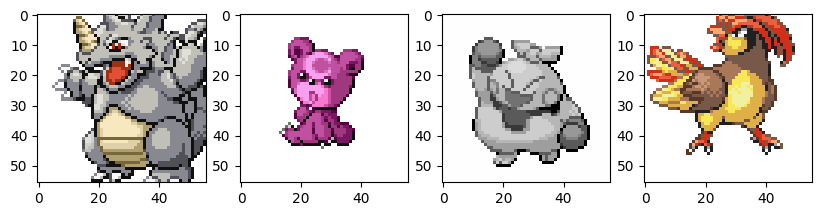

In [4]:
transform = v2.Compose([
    v2.RandomCrop((56, 56)),
    v2.RandomApply([v2.ColorJitter()], 0.2),
    v2.RandomApply([v2.RandomChannelPermutation()], 0.2),
    v2.RandomGrayscale(p = 0.2),
])

source = randint(0, 2)
batch = torch.randperm(385)[:4]
x0 = pimages[source, batch]
x0 = torch.stack([transform(x) for x in x0], dim=0)

fig, axes = plt.subplots(1, 4, figsize=(10, 10))
plot_image(x0[0], axes[0])
plot_image(x0[1], axes[1])
plot_image(x0[2], axes[2])
plot_image(x0[3], axes[3])
plt.show()

In [5]:
def isigmoid(x):
    eps = 0.05
    return torch.log(x + eps) - torch.log(1 - x + eps)


In [6]:
model = UNet_conditional(3, 3, num_classes=len(all_types) + 1).to(device)

@torch.no_grad
def generate_image():
    model.eval()

    N = 3

    x = torch.randn((N, 3, 64, 64), device=device)

    ty = [["Grass"], ["Fire"], ["Water"]]
    ty = torch.tensor([get_index(t) for t in ty], device=device)
    
    for t in reversed(range(T)):
        tt = torch.tensor([t] * N, device=device)

        z = torch.randn_like(x)
        if t == 0:
            z *= 0

        #x0 = model(x, tt)
        #x = torch.sqrt(alpha_[t]) * x0 + torch.sqrt(1-alpha_[t]) * z

        e = model(x, tt, ty) * (1 - alpha[t]) / torch.sqrt(1 - alpha_[t])
        x = (1 / torch.sqrt(alpha[t])) * (x - e) + z * torch.sqrt(beta[t])
    
    x = torch.sigmoid(x)
    
    fig, axes = plt.subplots(1, N, figsize=(10, 10))
    for i in range(N):
        plot_image(x[i], axes[i])
    plt.show()

    model.train()

In [7]:
#sd = torch.load("model.pt")
#model.load_state_dict(sd)

#generate_image()

  0%|                                                                                                                                | 0/150001 [00:00<?, ?it/s]

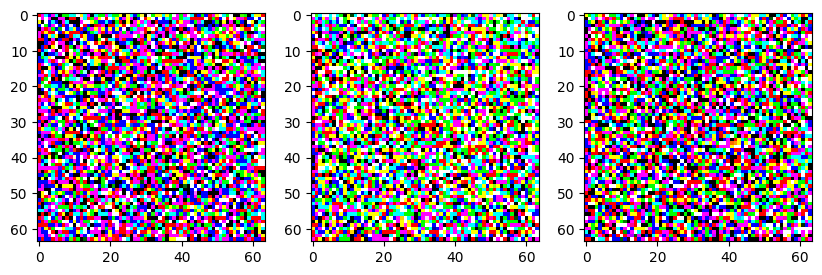

0.09287957:   1%|▋                                                                                                       | 999/150001 [00:53<2:04:55, 19.88it/s]

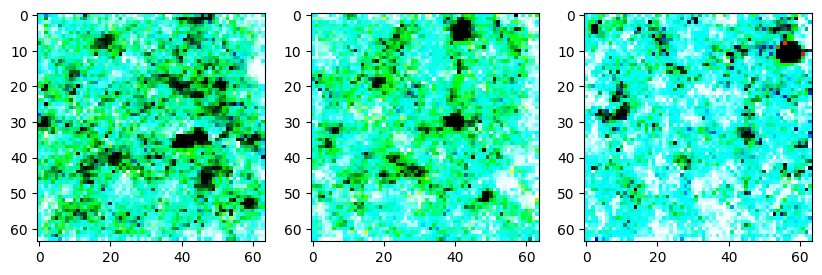

0.02461881:   1%|█▎                                                                                                     | 1999/150001 [01:46<2:04:30, 19.81it/s]

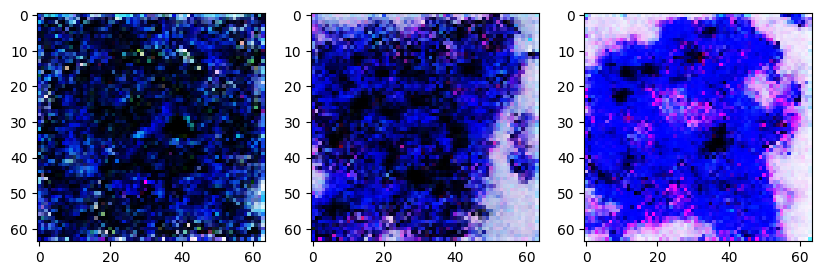

0.02245137:   2%|██                                                                                                     | 3000/150001 [02:38<2:03:32, 19.83it/s]

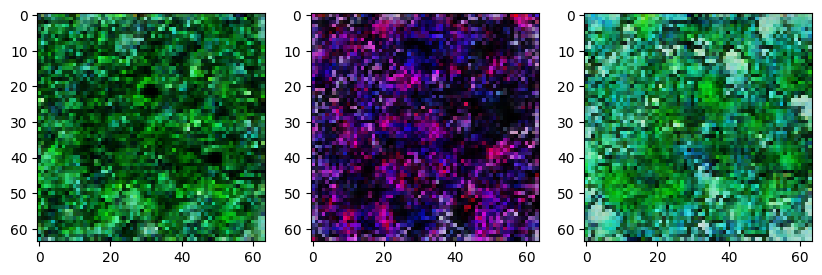

0.03516683:   3%|██▋                                                                                                    | 3999/150001 [03:31<2:02:39, 19.84it/s]

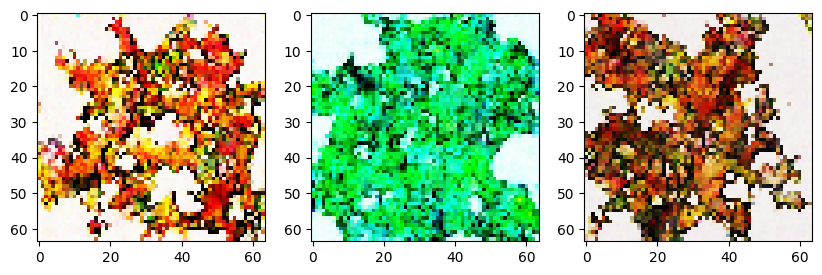

0.02388263:   3%|███▍                                                                                                   | 5000/150001 [04:24<2:01:02, 19.97it/s]

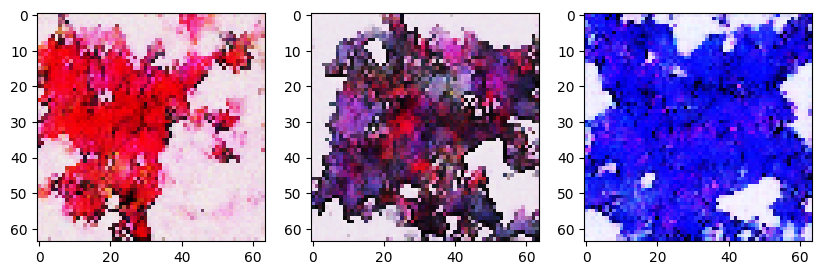

0.01831292:   4%|████                                                                                                   | 5999/150001 [05:16<2:00:15, 19.96it/s]

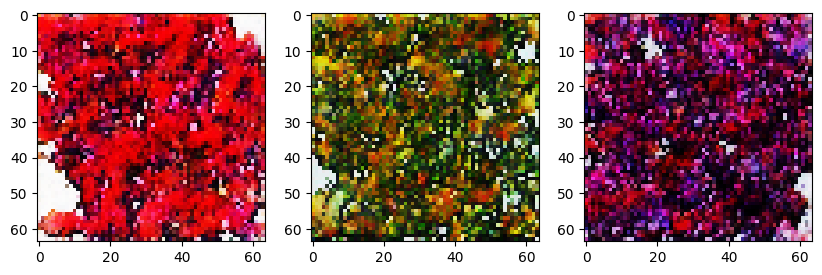

0.01543052:   5%|████▊                                                                                                  | 6999/150001 [06:09<1:59:31, 19.94it/s]

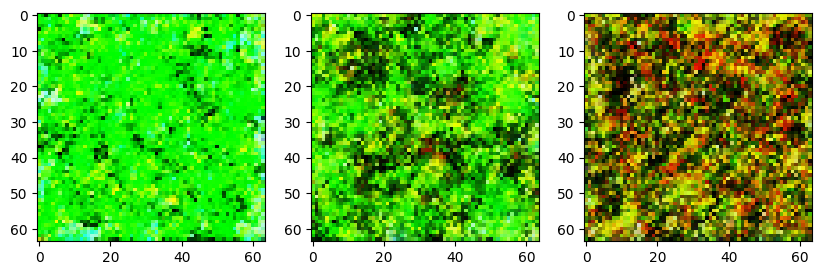

0.02435546:   5%|█████▍                                                                                                 | 7999/150001 [07:02<1:59:08, 19.86it/s]

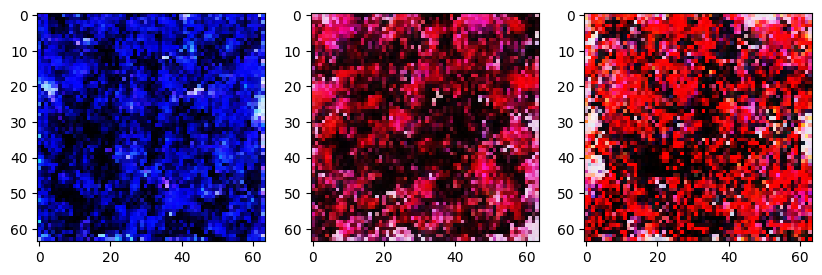

0.05158708:   6%|██████▏                                                                                                | 8999/150001 [07:55<1:58:07, 19.89it/s]

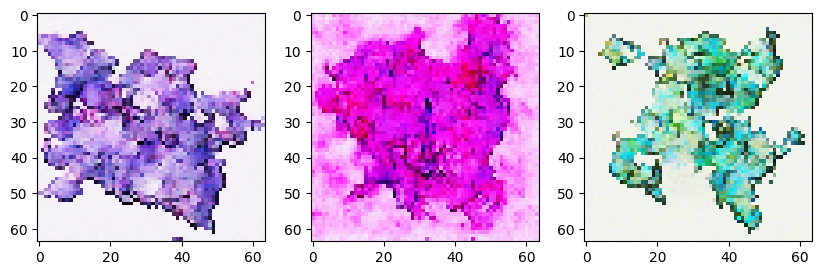

0.02793935:   7%|██████▊                                                                                                | 9999/150001 [08:47<1:57:09, 19.92it/s]

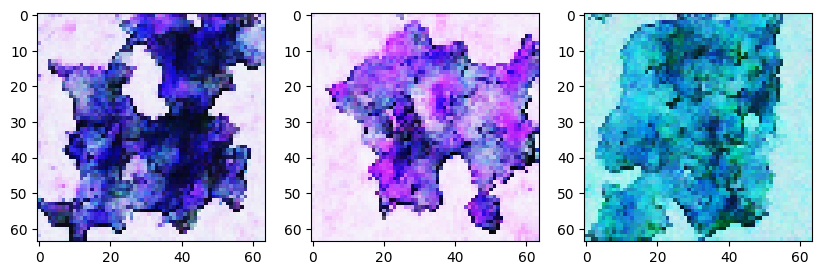

0.03446934:   7%|███████▍                                                                                              | 10999/150001 [09:40<1:56:28, 19.89it/s]

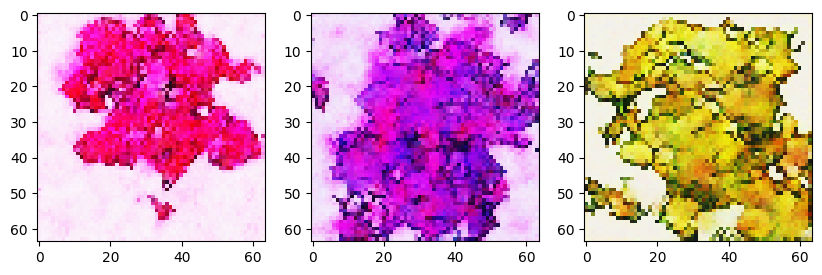

0.02106677:   8%|████████▏                                                                                             | 12000/150001 [10:33<1:55:40, 19.88it/s]

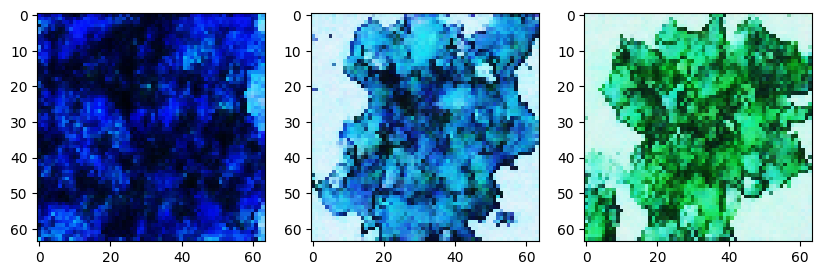

0.04215127:   9%|████████▊                                                                                             | 12999/150001 [11:25<1:54:51, 19.88it/s]

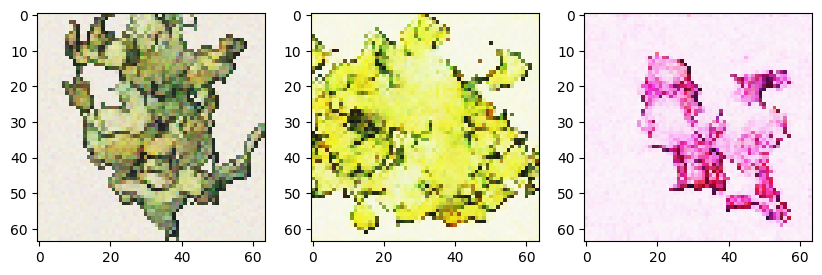

0.05550444:   9%|█████████▌                                                                                            | 14000/150001 [12:18<1:53:59, 19.89it/s]

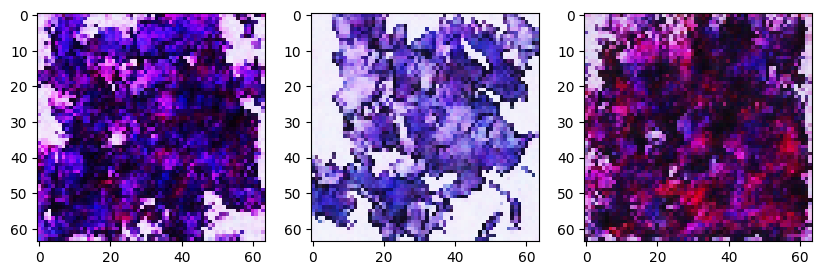

0.04612533:  10%|██████████▏                                                                                           | 14998/150001 [13:11<1:52:00, 20.09it/s]

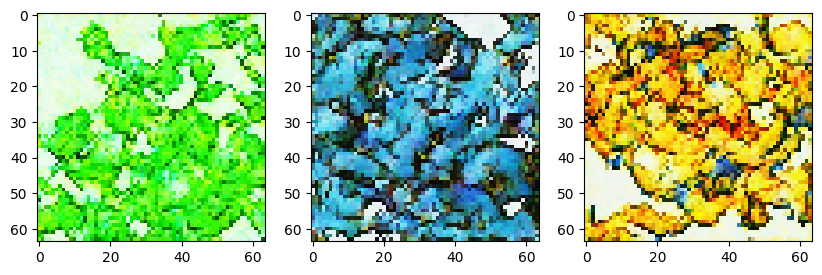

0.04425153:  11%|██████████▉                                                                                           | 15999/150001 [14:03<1:52:31, 19.85it/s]

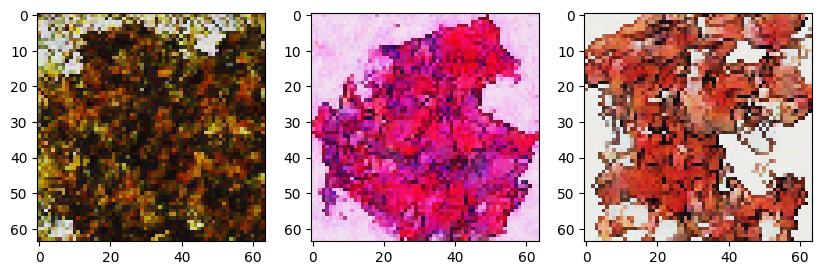

0.03247370:  11%|███████████▌                                                                                          | 16999/150001 [14:56<1:50:36, 20.04it/s]

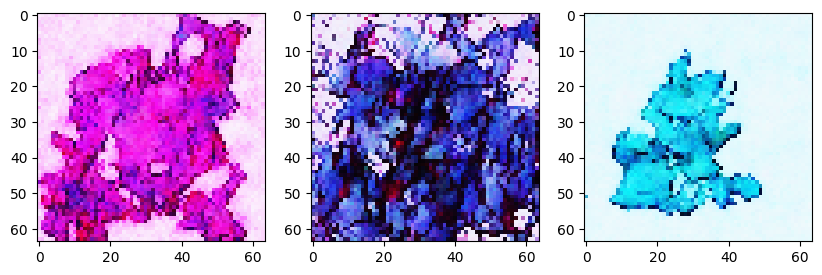

0.01556491:  12%|████████████▏                                                                                         | 17999/150001 [15:48<1:50:49, 19.85it/s]

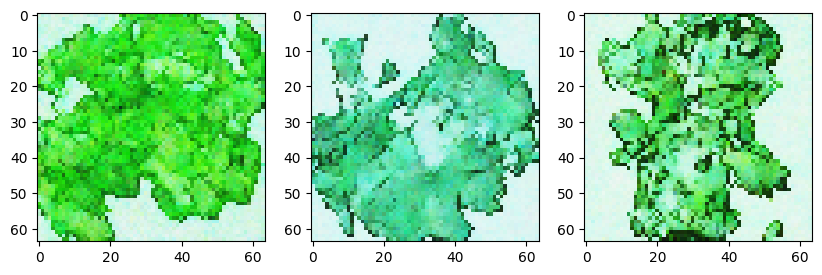

0.02906896:  13%|████████████▉                                                                                         | 19000/150001 [16:41<1:50:03, 19.84it/s]

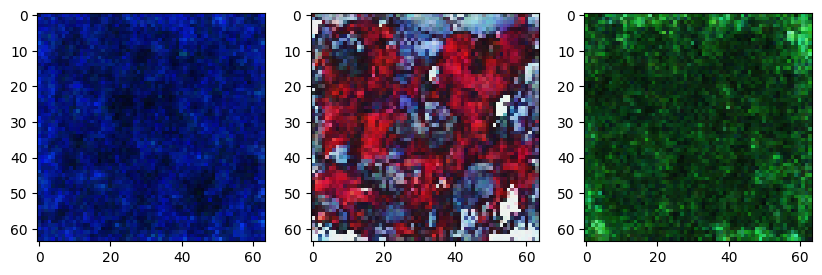

0.03479843:  13%|█████████████▌                                                                                        | 19999/150001 [17:34<1:48:58, 19.88it/s]

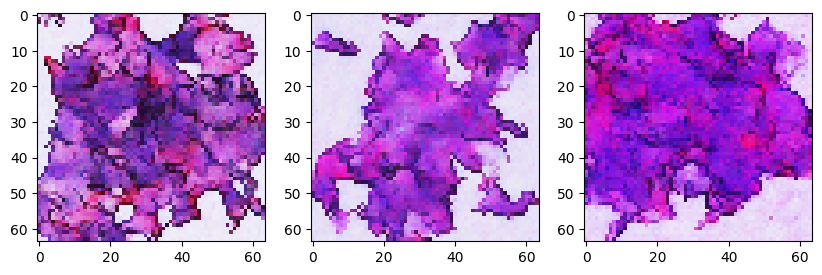

0.02290745:  14%|██████████████▎                                                                                       | 21000/150001 [18:27<1:48:16, 19.86it/s]

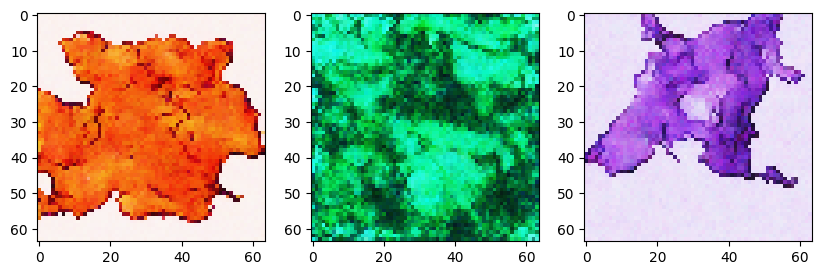

0.02059663:  15%|██████████████▉                                                                                       | 21999/150001 [19:19<1:47:34, 19.83it/s]

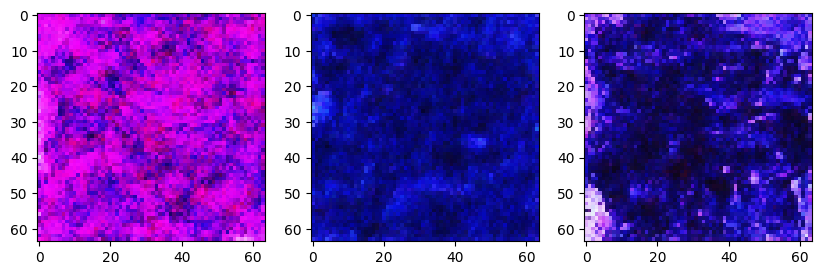

0.03061901:  15%|███████████████▋                                                                                      | 22999/150001 [20:12<1:46:18, 19.91it/s]

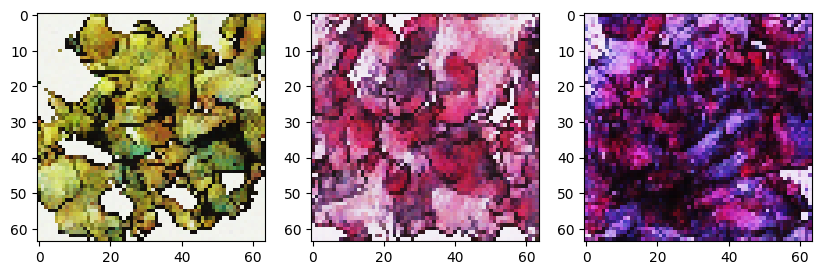

0.03778492:  16%|████████████████▎                                                                                     | 23999/150001 [21:05<1:45:40, 19.87it/s]

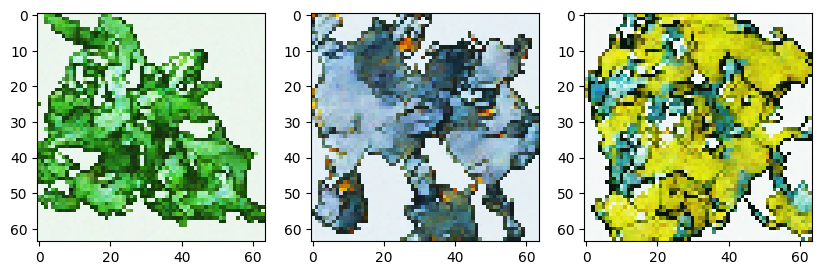

0.03917987:  17%|████████████████▉                                                                                     | 25000/150001 [21:58<1:44:47, 19.88it/s]

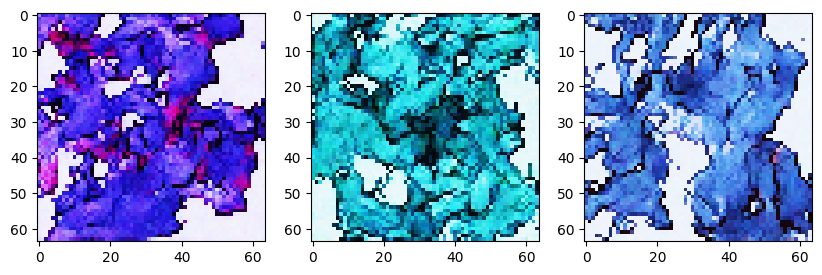

0.02518791:  17%|█████████████████▋                                                                                    | 25999/150001 [22:50<1:44:11, 19.83it/s]

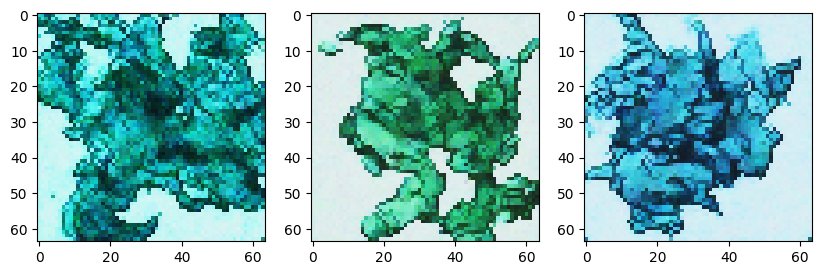

0.01437263:  18%|██████████████████▎                                                                                   | 26999/150001 [23:43<1:43:15, 19.85it/s]

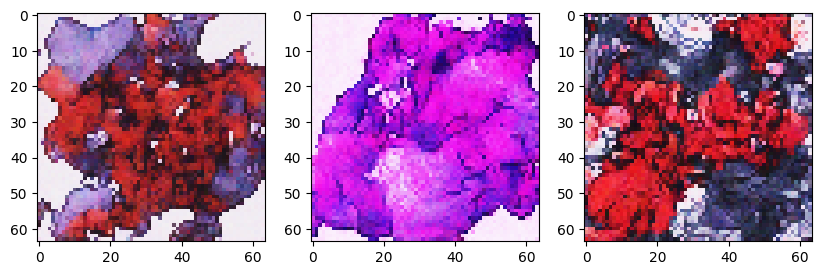

0.01252981:  19%|███████████████████                                                                                   | 27999/150001 [24:36<1:42:09, 19.90it/s]

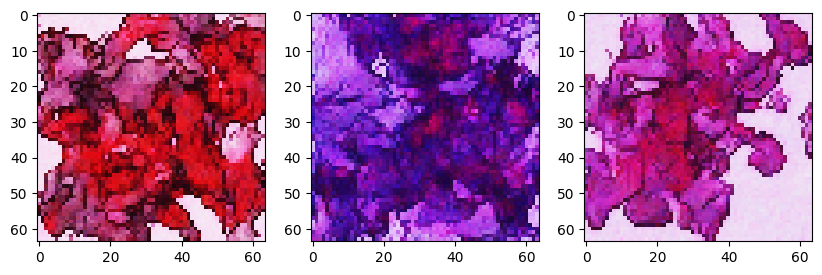

0.02183148:  19%|███████████████████▋                                                                                  | 28999/150001 [25:29<1:41:35, 19.85it/s]

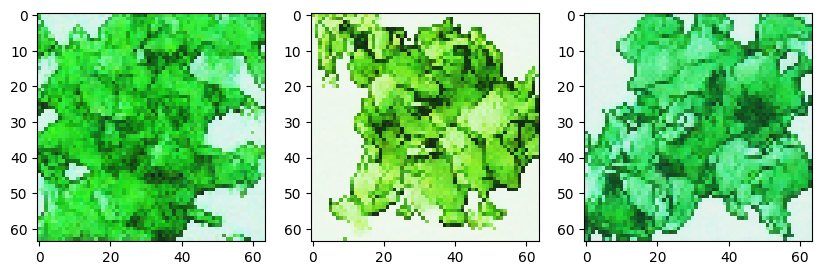

0.02314900:  20%|████████████████████▍                                                                                 | 29999/150001 [26:21<1:40:35, 19.88it/s]

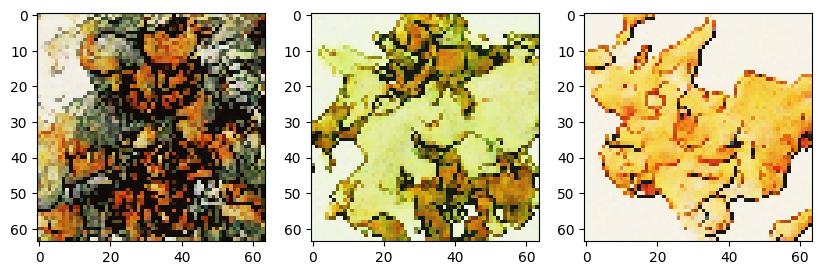

0.02968304:  21%|█████████████████████                                                                                 | 30999/150001 [27:14<1:39:53, 19.85it/s]

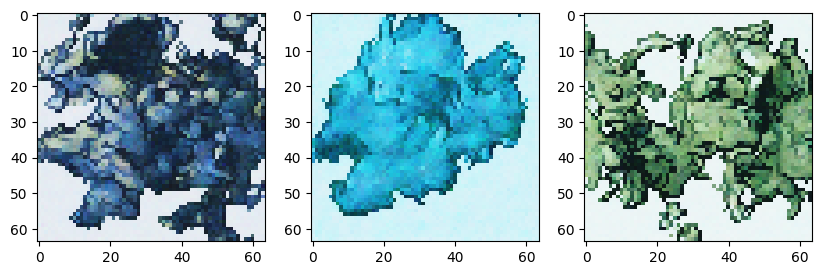

0.02262610:  21%|█████████████████████▊                                                                                | 32000/150001 [28:07<1:39:13, 19.82it/s]

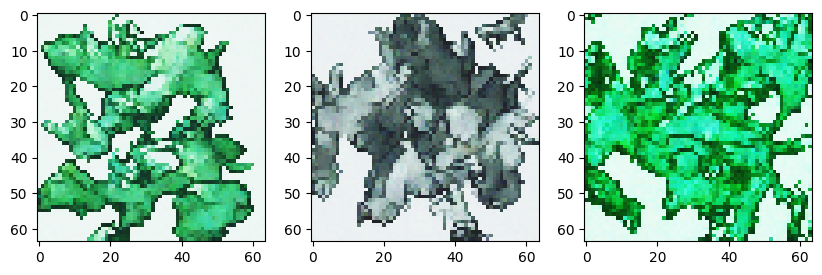

0.00950426:  22%|██████████████████████▍                                                                               | 32999/150001 [29:00<1:38:31, 19.79it/s]

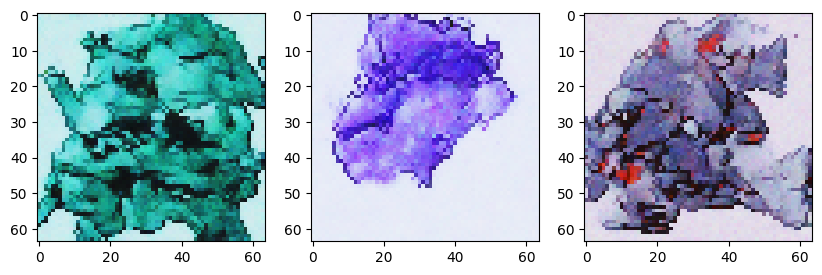

0.03524298:  23%|███████████████████████                                                                               | 34000/150001 [29:53<1:37:25, 19.85it/s]

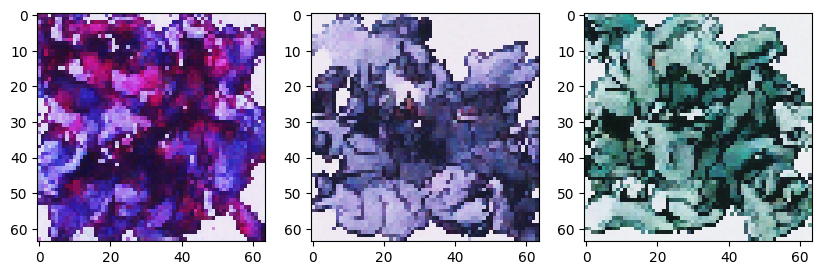

0.01896734:  23%|███████████████████████▊                                                                              | 35000/150001 [30:46<1:36:25, 19.88it/s]

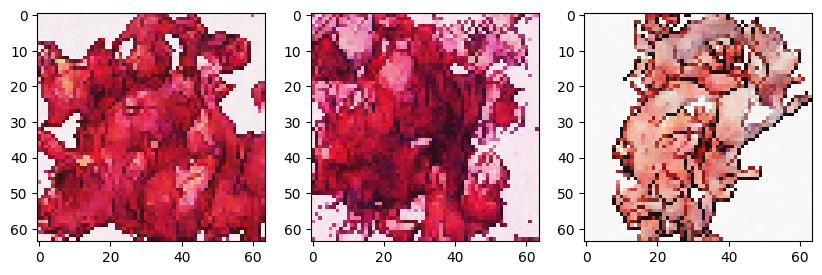

0.03261195:  24%|████████████████████████▍                                                                             | 35999/150001 [31:38<1:35:18, 19.94it/s]

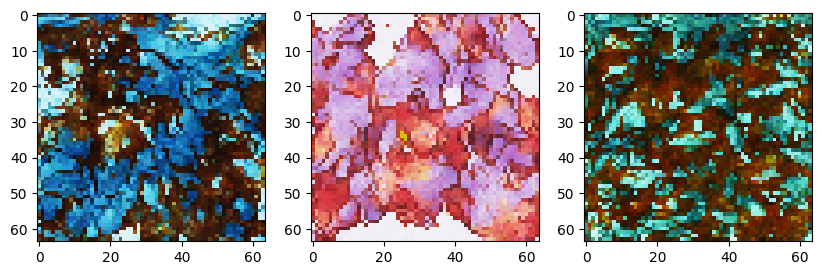

0.03513691:  25%|█████████████████████████▏                                                                            | 37000/150001 [32:31<1:34:45, 19.88it/s]

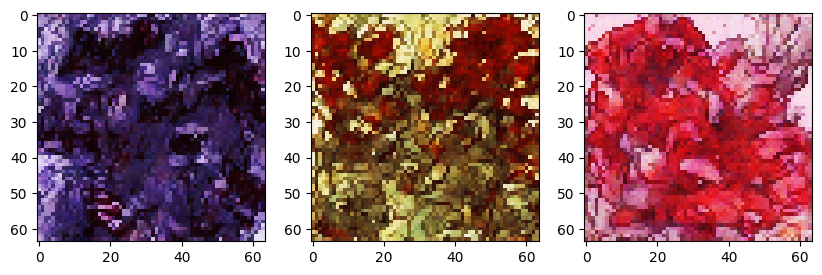

0.02557230:  25%|█████████████████████████▊                                                                            | 37999/150001 [33:24<1:33:57, 19.87it/s]

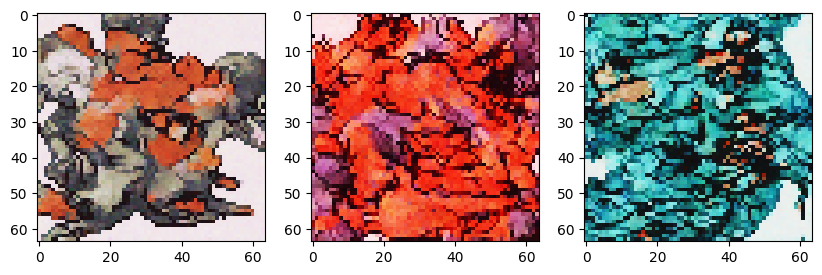

0.01442978:  26%|██████████████████████████▌                                                                           | 39000/150001 [34:17<1:33:15, 19.84it/s]

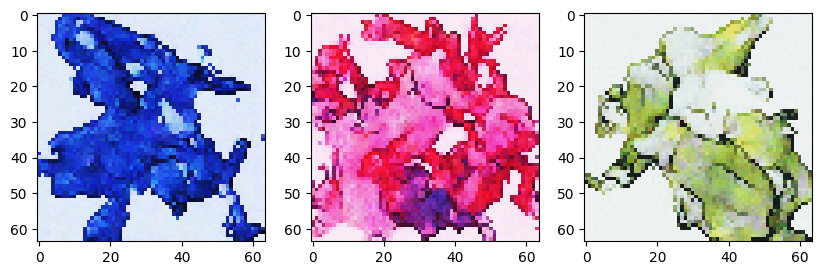

0.02135129:  27%|███████████████████████████▏                                                                          | 40000/150001 [35:10<1:32:16, 19.87it/s]

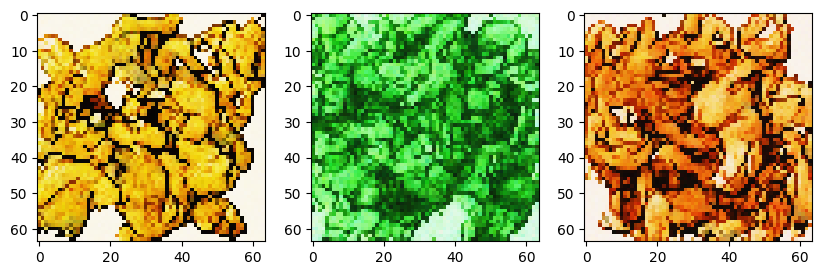

0.02245868:  27%|███████████████████████████▉                                                                          | 40999/150001 [36:02<1:31:37, 19.83it/s]

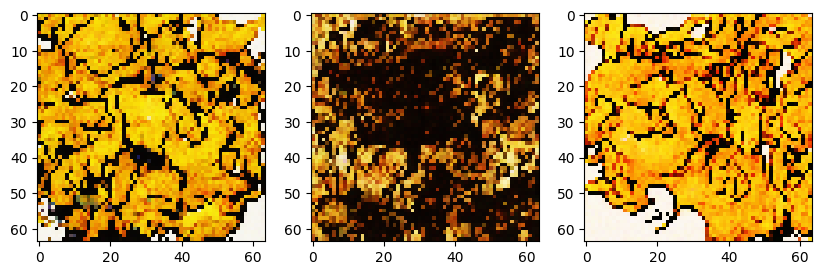

0.04776058:  28%|████████████████████████████▌                                                                         | 42000/150001 [36:55<1:30:25, 19.91it/s]

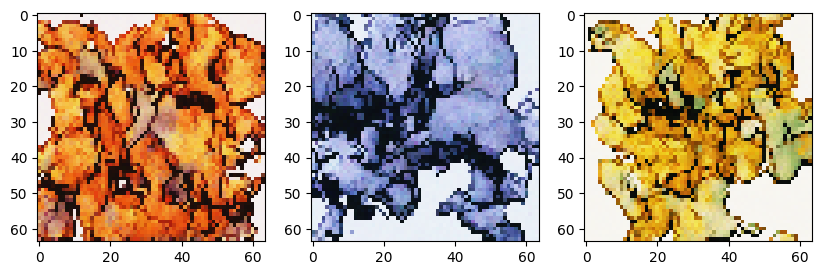

0.02597335:  29%|█████████████████████████████▏                                                                        | 42999/150001 [37:48<1:29:55, 19.83it/s]

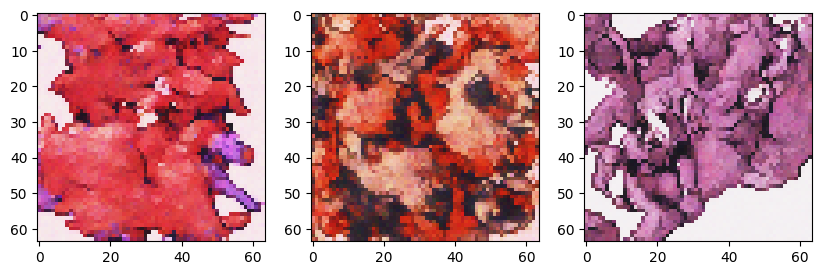

0.01925607:  29%|█████████████████████████████▉                                                                        | 44000/150001 [38:41<1:28:59, 19.85it/s]

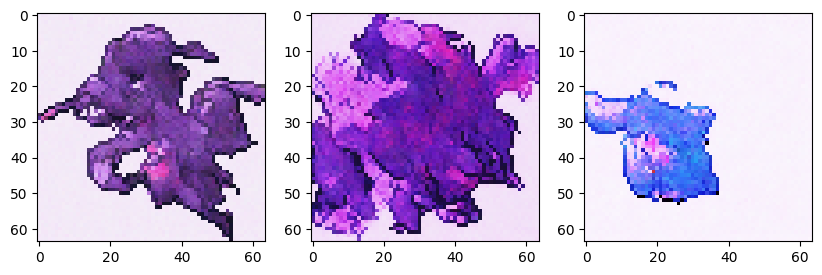

0.02739430:  30%|██████████████████████████████▌                                                                       | 45000/150001 [39:33<1:28:14, 19.83it/s]

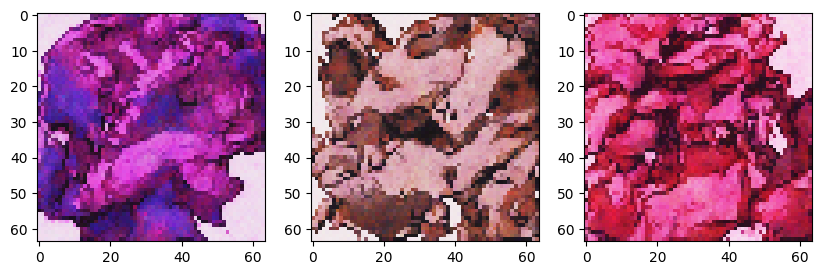

0.02890993:  31%|███████████████████████████████▎                                                                      | 46000/150001 [40:26<1:27:05, 19.90it/s]

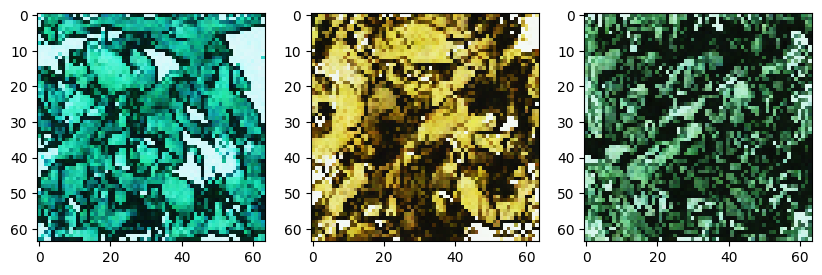

0.02904207:  31%|███████████████████████████████▉                                                                      | 46999/150001 [41:19<1:26:19, 19.89it/s]

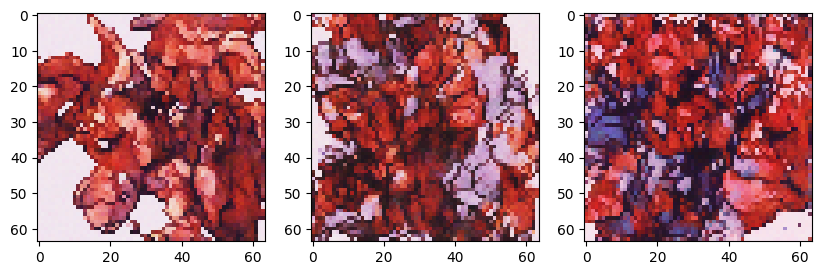

0.01655870:  32%|████████████████████████████████▋                                                                     | 47999/150001 [42:12<1:25:22, 19.91it/s]

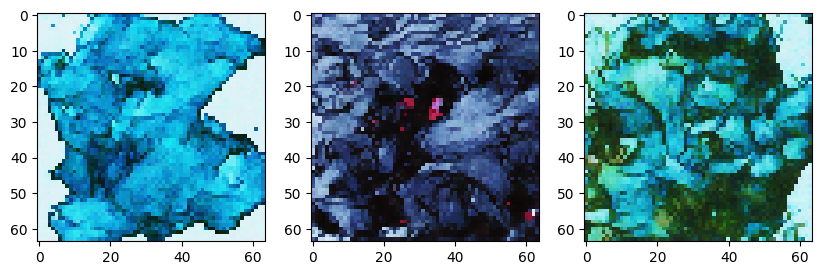

0.01094881:  33%|█████████████████████████████████▎                                                                    | 48999/150001 [43:04<1:24:49, 19.85it/s]

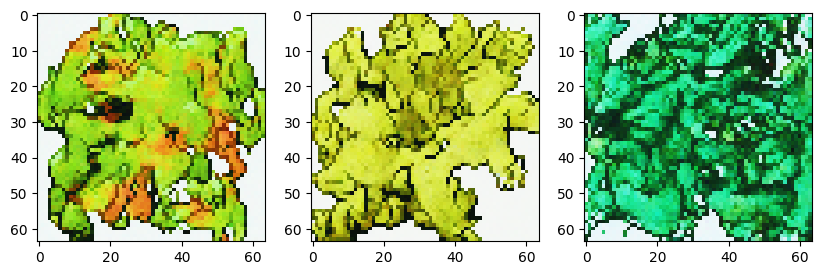

0.01974898:  33%|█████████████████████████████████▉                                                                    | 49999/150001 [43:57<1:24:01, 19.84it/s]

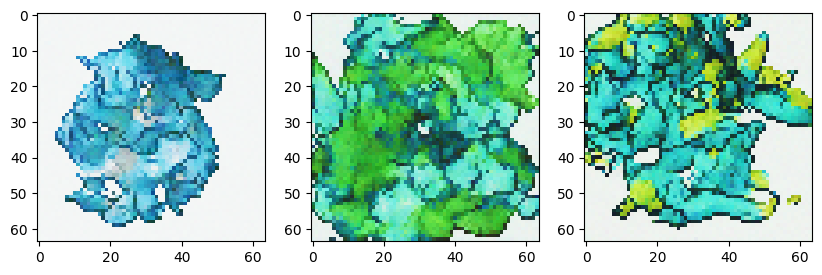

0.01397832:  34%|██████████████████████████████████▋                                                                   | 50999/150001 [44:50<1:22:56, 19.89it/s]

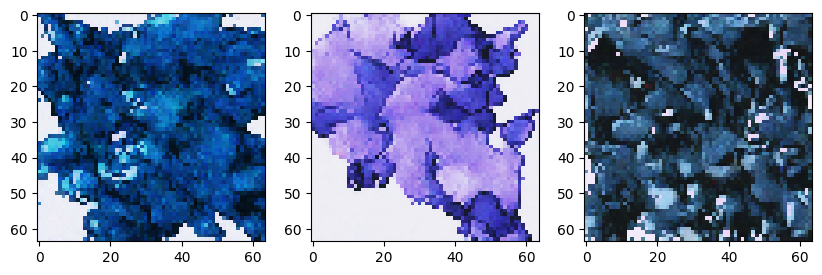

0.03113159:  35%|███████████████████████████████████▎                                                                  | 51999/150001 [45:43<1:22:13, 19.87it/s]

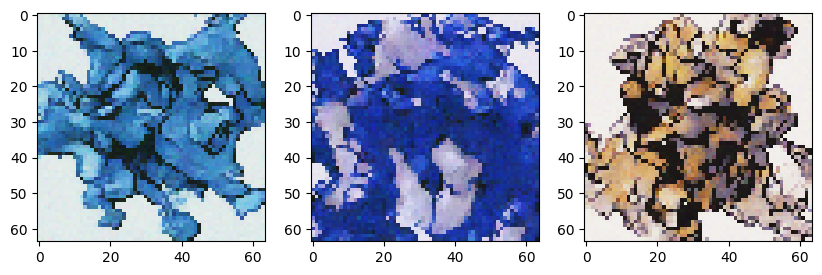

0.03580227:  35%|████████████████████████████████████                                                                  | 53000/150001 [46:35<1:21:26, 19.85it/s]

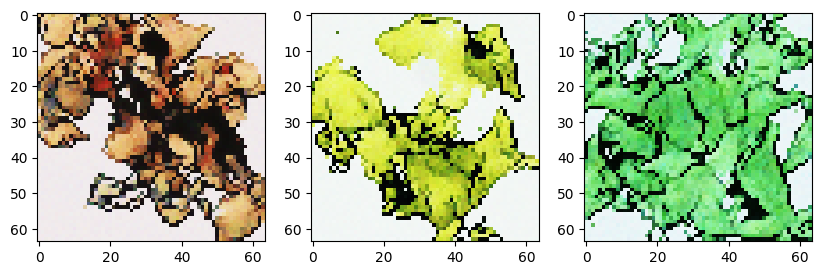

0.01611655:  36%|████████████████████████████████████▋                                                                 | 53999/150001 [47:28<1:20:23, 19.90it/s]

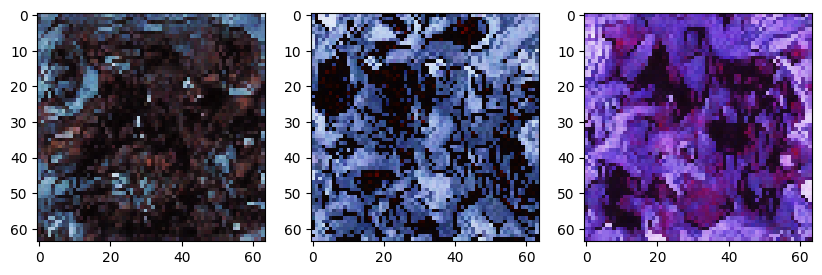

0.01297938:  37%|█████████████████████████████████████▍                                                                | 55000/150001 [48:21<1:19:38, 19.88it/s]

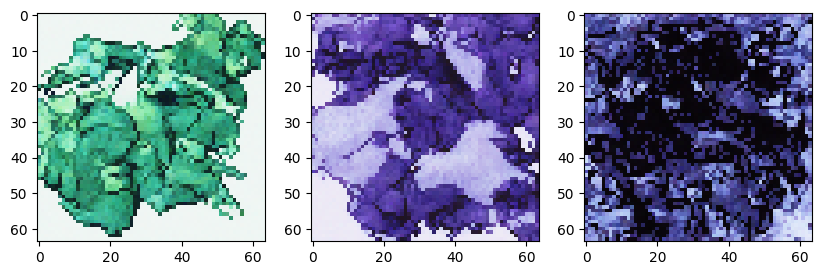

0.03002330:  37%|██████████████████████████████████████                                                                | 56000/150001 [49:14<1:18:40, 19.91it/s]

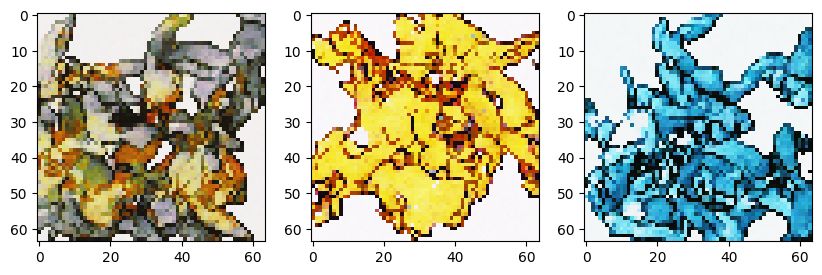

0.03859201:  38%|██████████████████████████████████████▊                                                               | 57000/150001 [50:06<1:18:18, 19.80it/s]

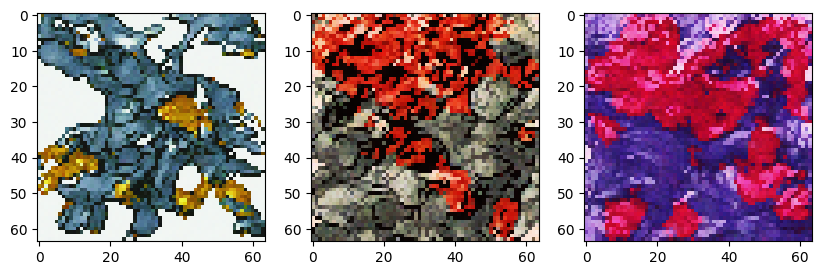

0.02412168:  39%|███████████████████████████████████████▍                                                              | 58000/150001 [50:59<1:17:24, 19.81it/s]

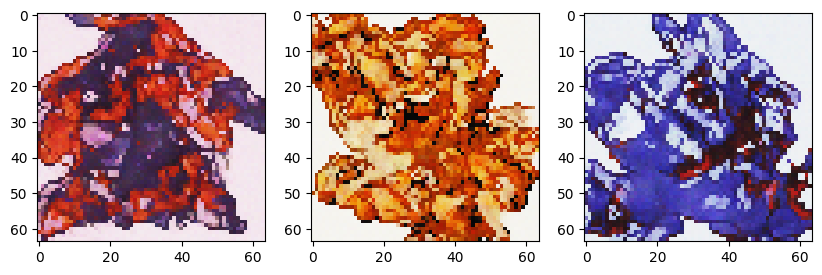

0.02893249:  39%|████████████████████████████████████████                                                              | 59000/150001 [51:52<1:16:23, 19.85it/s]

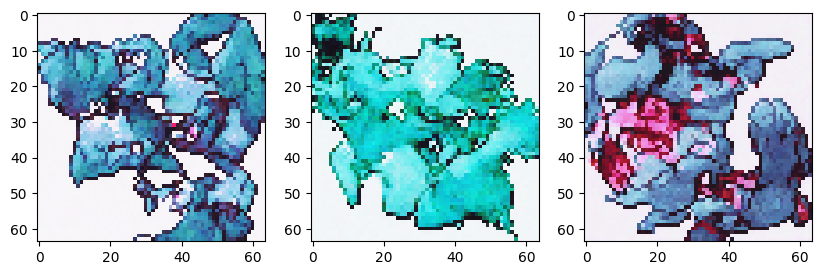

0.02883339:  40%|████████████████████████████████████████▊                                                             | 59999/150001 [52:44<1:15:37, 19.84it/s]

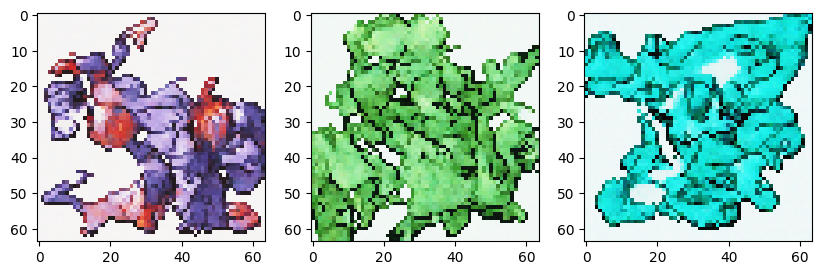

0.02780790:  41%|█████████████████████████████████████████▍                                                            | 61000/150001 [53:37<1:14:41, 19.86it/s]

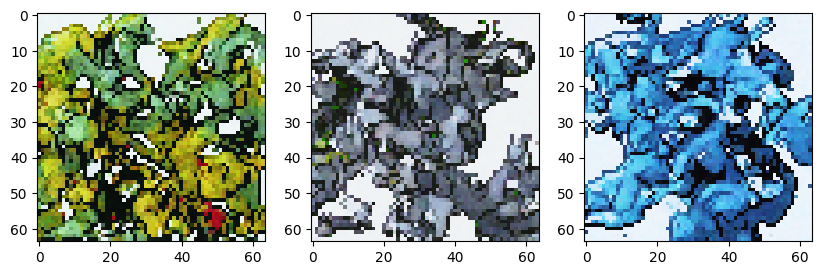

0.03616851:  41%|██████████████████████████████████████████▏                                                           | 61999/150001 [54:30<1:13:38, 19.92it/s]

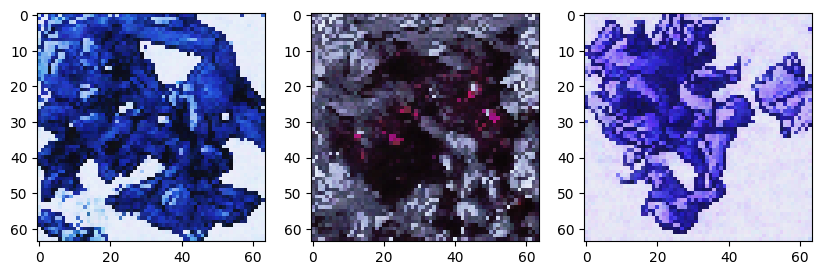

0.01926090:  42%|██████████████████████████████████████████▊                                                           | 63000/150001 [55:23<1:13:05, 19.84it/s]

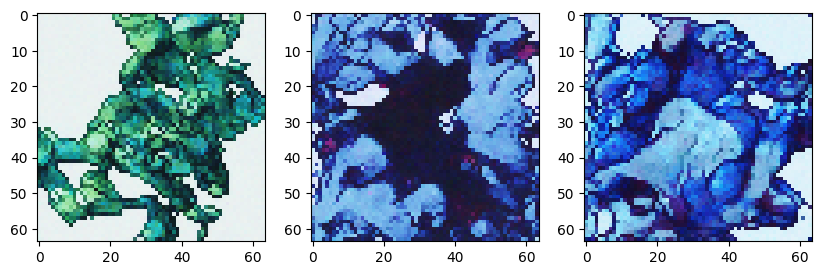

0.02392957:  43%|███████████████████████████████████████████▌                                                          | 63999/150001 [56:16<1:12:13, 19.85it/s]

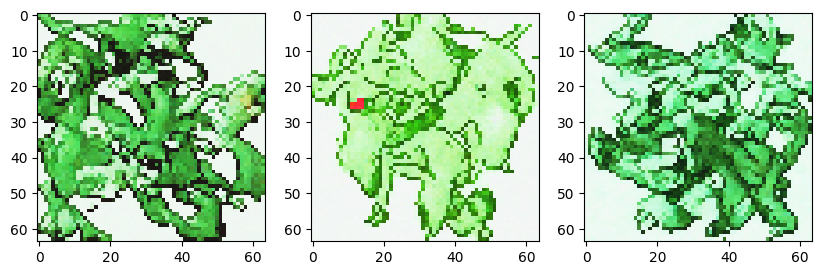

0.02475177:  43%|████████████████████████████████████████████▏                                                         | 64999/150001 [57:08<1:11:23, 19.84it/s]

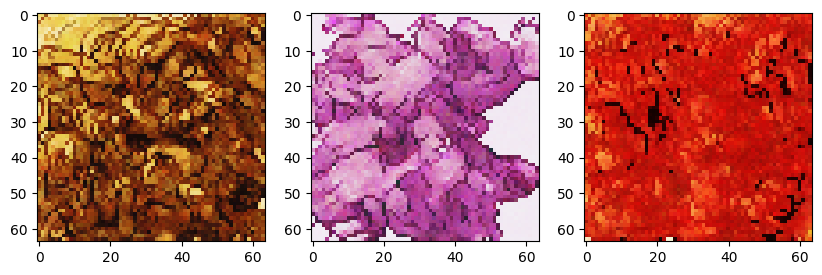

0.02119529:  44%|████████████████████████████████████████████▉                                                         | 65999/150001 [58:01<1:10:32, 19.85it/s]

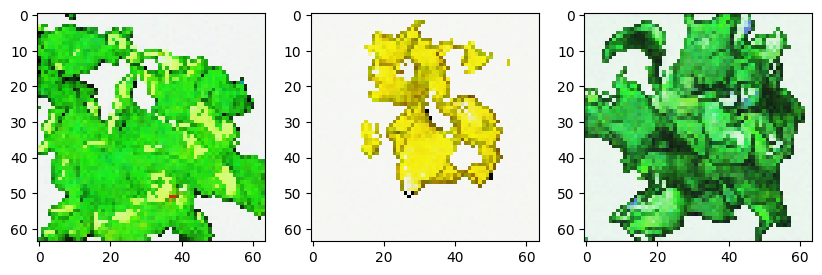

0.01705541:  45%|█████████████████████████████████████████████▌                                                        | 66999/150001 [58:54<1:09:31, 19.90it/s]

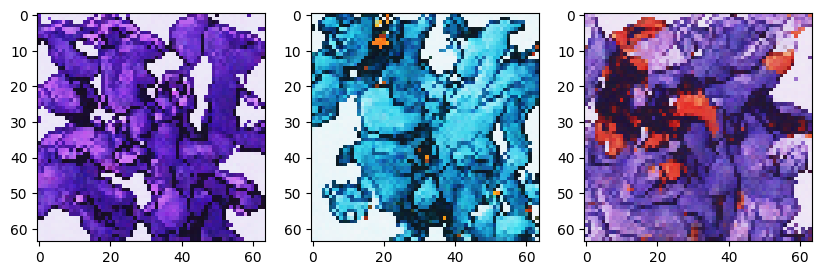

0.01462144:  45%|██████████████████████████████████████████████▏                                                       | 67999/150001 [59:47<1:08:50, 19.85it/s]

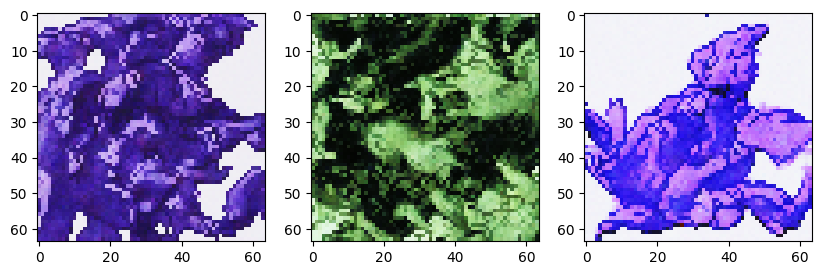

0.01177018:  46%|█████████████████████████████████████████████▉                                                      | 68999/150001 [1:00:39<1:07:55, 19.87it/s]

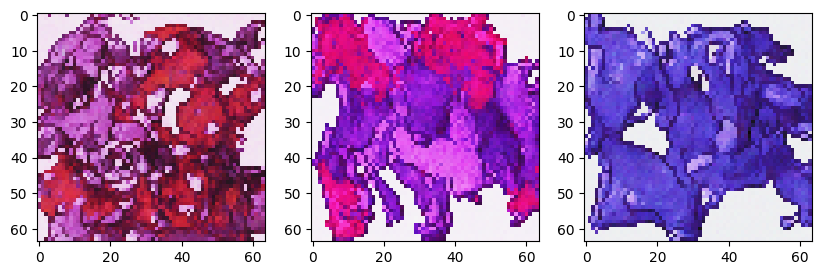

0.02314487:  47%|██████████████████████████████████████████████▋                                                     | 69999/150001 [1:01:32<1:07:12, 19.84it/s]

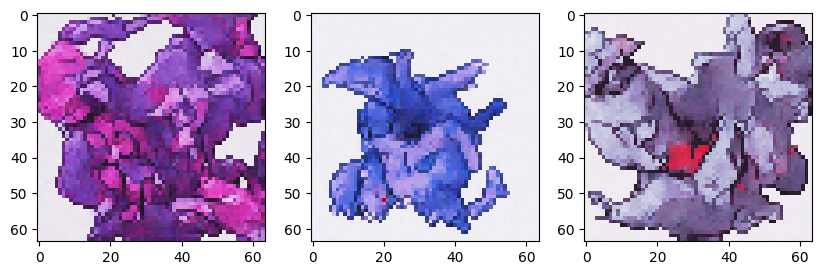

0.02449380:  47%|███████████████████████████████████████████████▎                                                    | 70999/150001 [1:02:25<1:06:21, 19.84it/s]

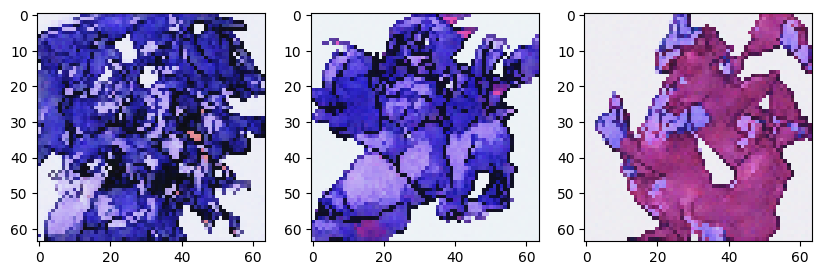

0.02647220:  48%|███████████████████████████████████████████████▉                                                    | 71999/150001 [1:03:18<1:05:38, 19.80it/s]

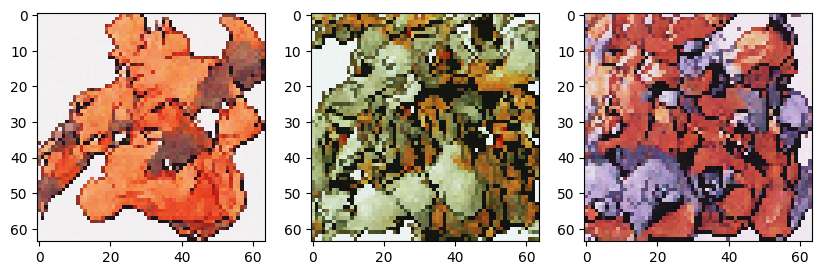

0.02489165:  49%|████████████████████████████████████████████████▋                                                   | 73000/150001 [1:04:11<1:04:39, 19.85it/s]

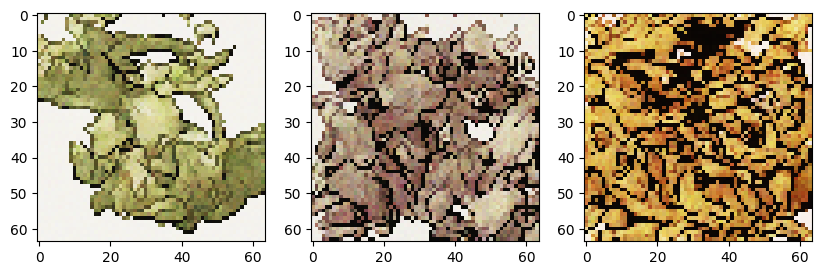

0.02730091:  49%|█████████████████████████████████████████████████▎                                                  | 73999/150001 [1:05:03<1:03:50, 19.84it/s]

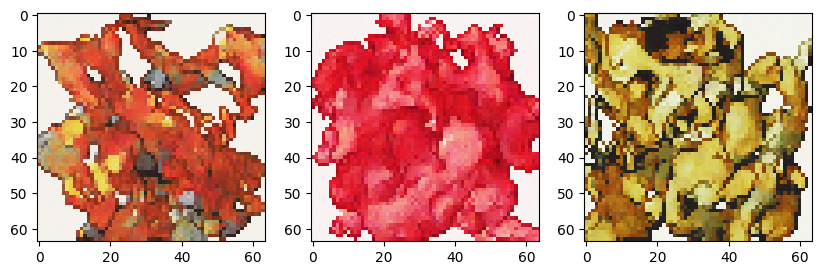

0.01197772:  50%|█████████████████████████████████████████████████▉                                                  | 74999/150001 [1:05:56<1:02:51, 19.89it/s]

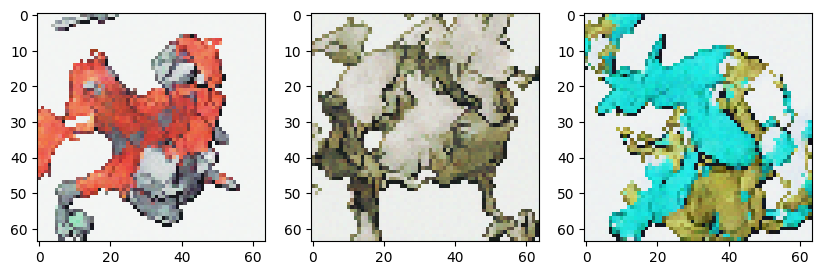

0.03045270:  51%|██████████████████████████████████████████████████▋                                                 | 75999/150001 [1:06:49<1:02:04, 19.87it/s]

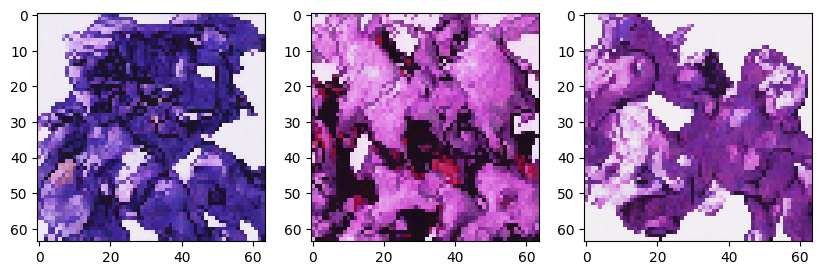

0.00961368:  51%|███████████████████████████████████████████████████▎                                                | 77000/150001 [1:07:42<1:01:16, 19.86it/s]

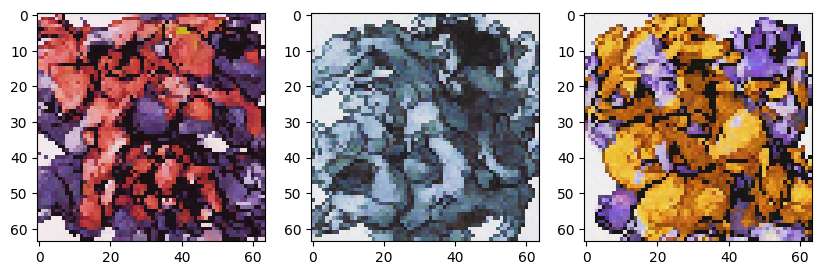

0.01886507:  52%|███████████████████████████████████████████████████▉                                                | 77999/150001 [1:08:34<1:00:24, 19.87it/s]

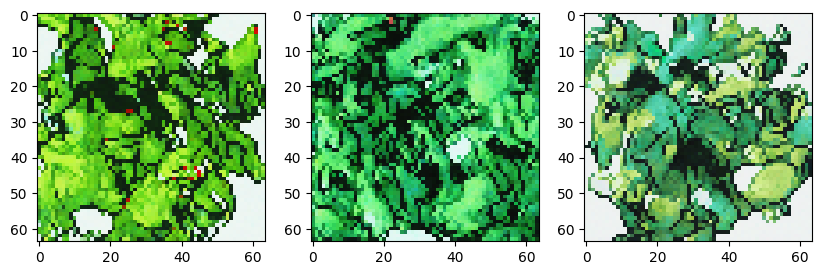

0.02331017:  53%|█████████████████████████████████████████████████████▋                                                | 78999/150001 [1:09:27<59:30, 19.89it/s]

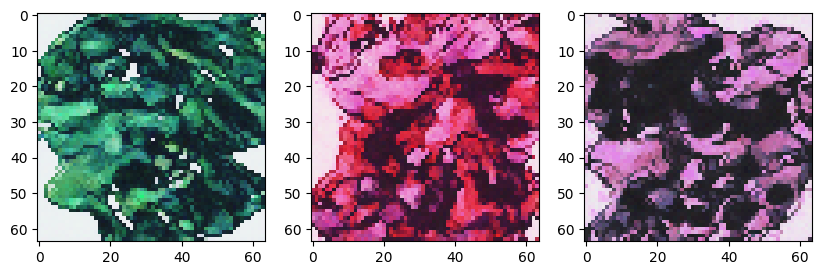

0.01968352:  53%|██████████████████████████████████████████████████████▍                                               | 80000/150001 [1:10:20<58:43, 19.86it/s]

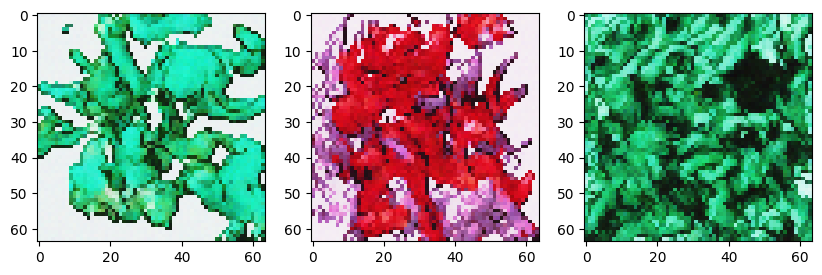

0.01813852:  54%|███████████████████████████████████████████████████████                                               | 81000/150001 [1:11:13<57:59, 19.83it/s]

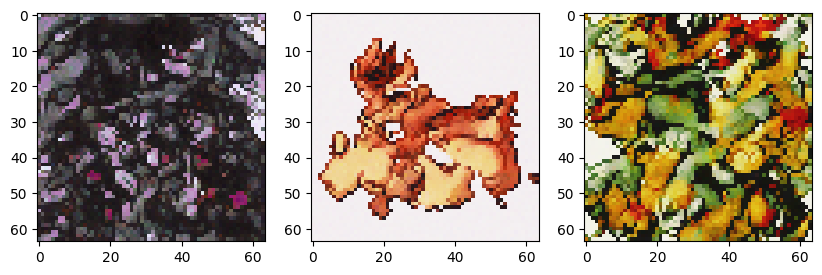

0.01604286:  55%|███████████████████████████████████████████████████████▊                                              | 82000/150001 [1:12:05<57:09, 19.83it/s]

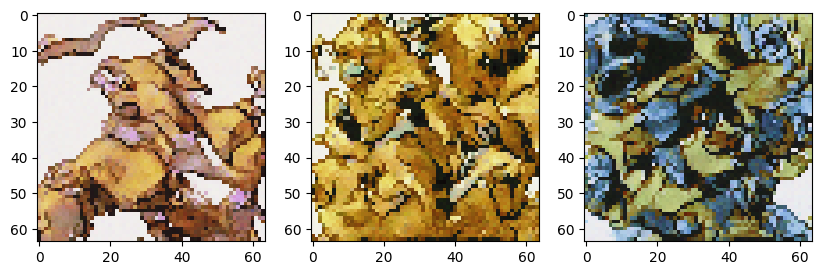

0.02257706:  55%|████████████████████████████████████████████████████████▍                                             | 82999/150001 [1:12:58<56:05, 19.91it/s]

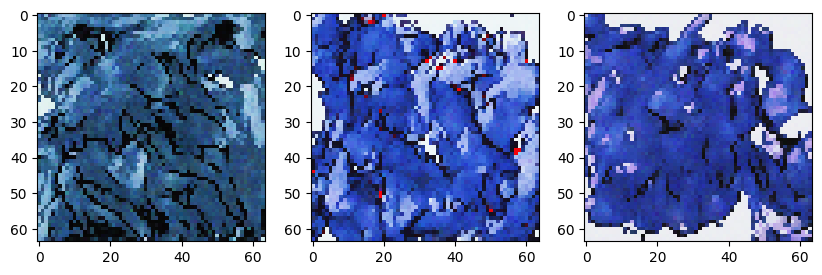

0.02900701:  56%|█████████████████████████████████████████████████████████                                             | 83999/150001 [1:13:51<55:22, 19.87it/s]

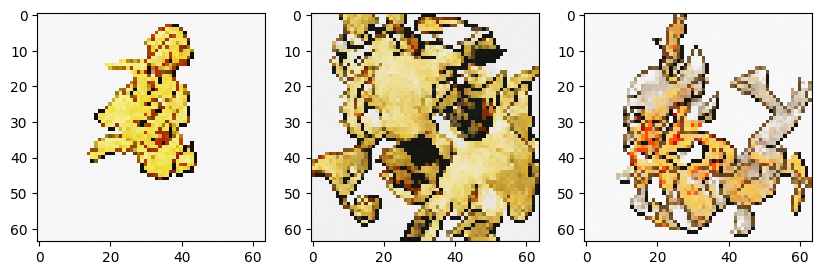

0.03178924:  57%|█████████████████████████████████████████████████████████▊                                            | 85000/150001 [1:14:44<54:33, 19.86it/s]

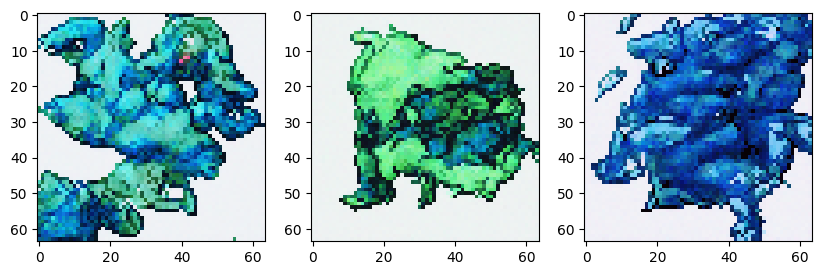

0.02236337:  57%|██████████████████████████████████████████████████████████▍                                           | 86000/150001 [1:15:36<53:42, 19.86it/s]

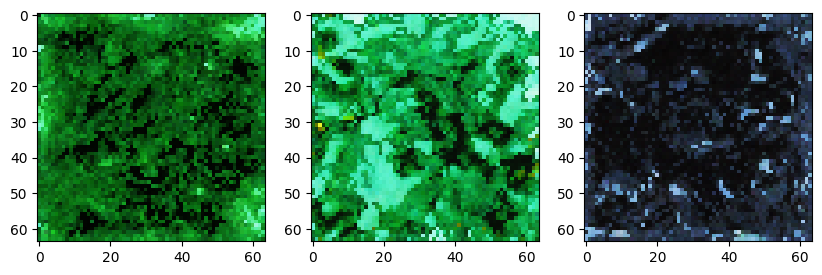

0.01812873:  58%|███████████████████████████████████████████████████████████▏                                          | 87000/150001 [1:16:29<52:47, 19.89it/s]

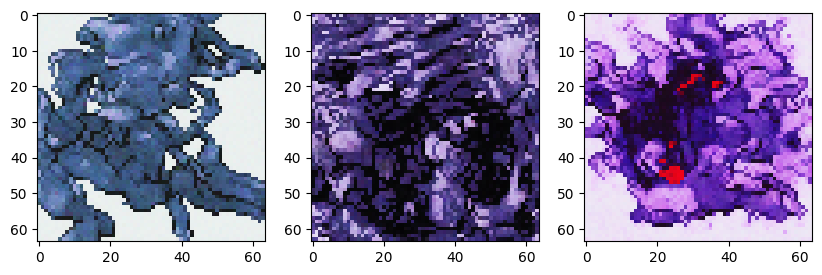

0.02266015:  59%|███████████████████████████████████████████████████████████▊                                          | 88000/150001 [1:17:22<52:03, 19.85it/s]

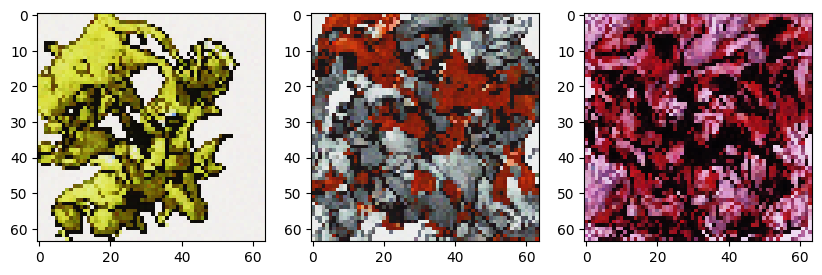

0.02558830:  59%|████████████████████████████████████████████████████████████▌                                         | 89000/150001 [1:18:15<51:12, 19.85it/s]

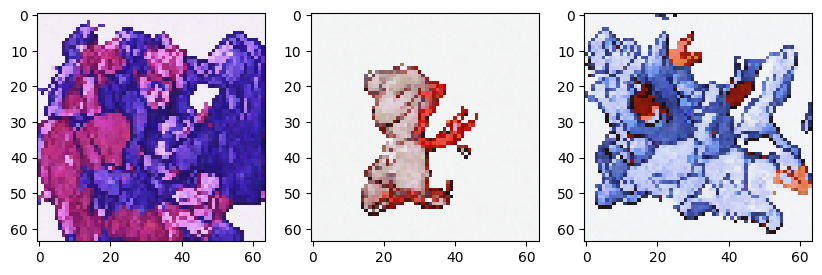

0.02446964:  60%|█████████████████████████████████████████████████████████████▏                                        | 90000/150001 [1:19:07<50:11, 19.92it/s]

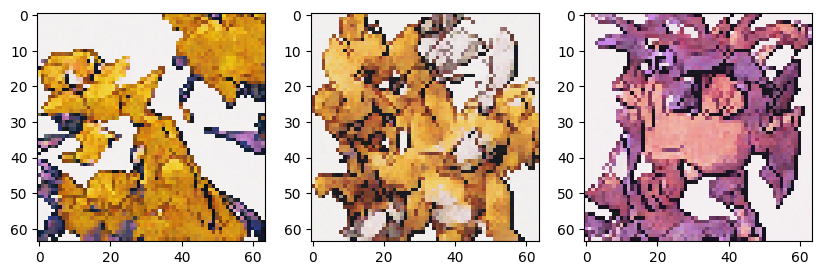

0.02925560:  61%|█████████████████████████████████████████████████████████████▉                                        | 91000/150001 [1:20:00<49:22, 19.92it/s]

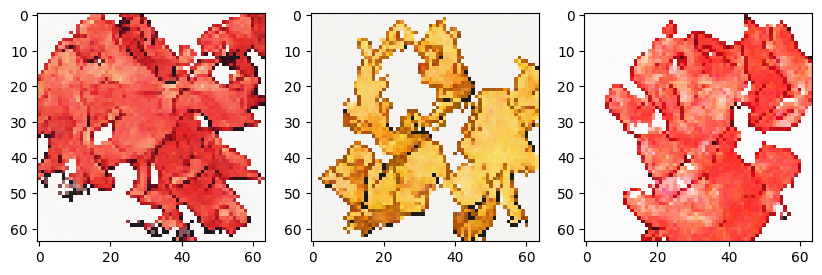

0.01831200:  61%|██████████████████████████████████████████████████████████████▌                                       | 91999/150001 [1:20:53<48:41, 19.85it/s]

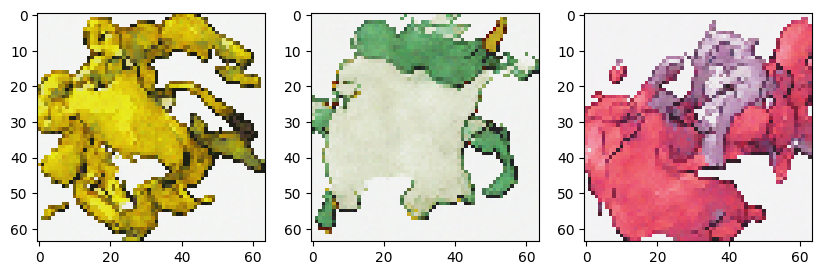

0.03451654:  62%|███████████████████████████████████████████████████████████████▏                                      | 93000/150001 [1:21:46<47:49, 19.87it/s]

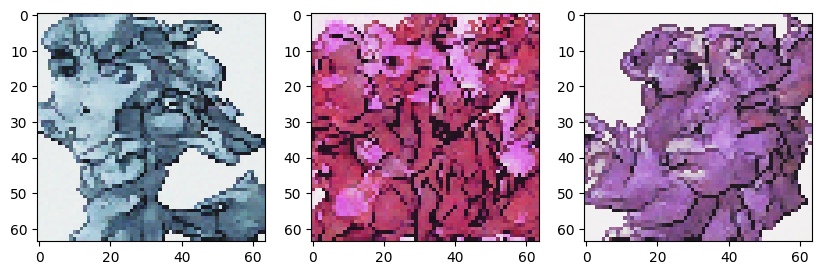

0.01633528:  63%|███████████████████████████████████████████████████████████████▉                                      | 94000/150001 [1:22:38<46:50, 19.92it/s]

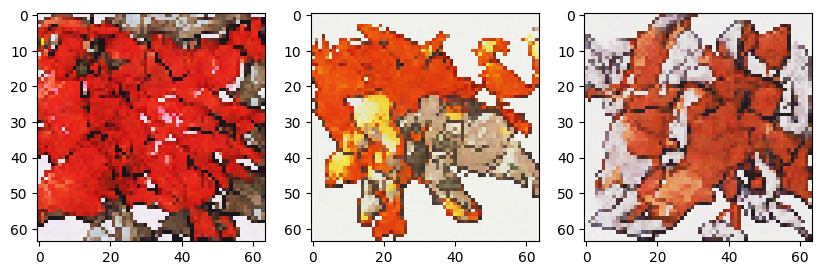

0.03137209:  63%|████████████████████████████████████████████████████████████████▌                                     | 94999/150001 [1:23:31<45:59, 19.93it/s]

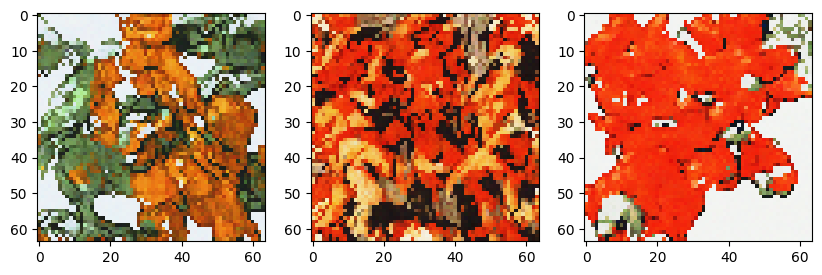

0.01470397:  64%|█████████████████████████████████████████████████████████████████▎                                    | 96000/150001 [1:24:24<45:22, 19.84it/s]

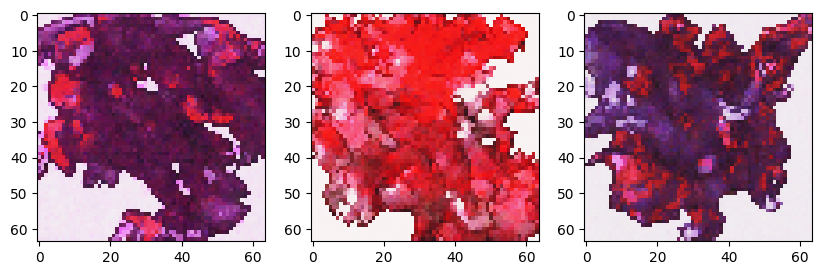

0.02270933:  65%|█████████████████████████████████████████████████████████████████▉                                    | 96999/150001 [1:25:16<44:20, 19.92it/s]

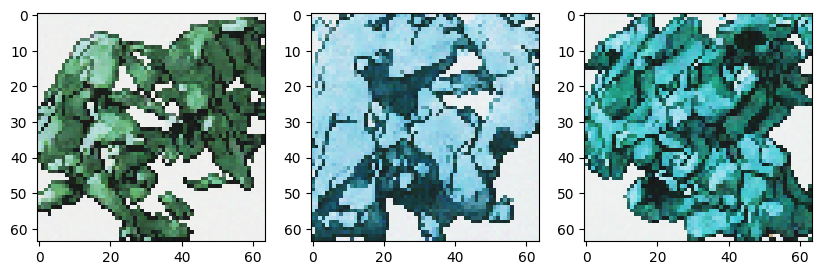

0.05693915:  65%|██████████████████████████████████████████████████████████████████▋                                   | 97999/150001 [1:26:09<43:42, 19.83it/s]

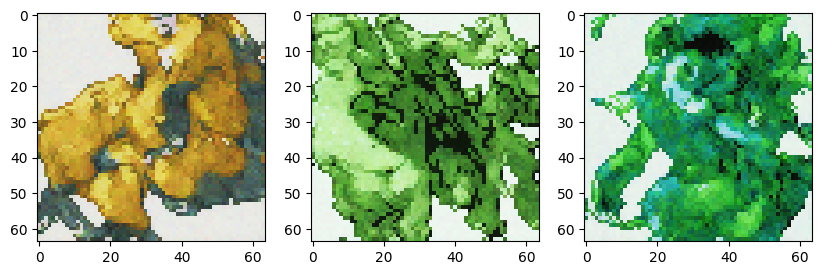

0.02973287:  66%|███████████████████████████████████████████████████████████████████▎                                  | 99000/150001 [1:27:02<42:41, 19.91it/s]

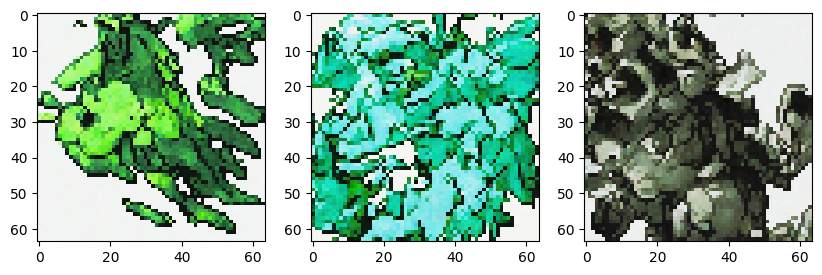

0.01828874:  67%|███████████████████████████████████████████████████████████████████▉                                  | 99999/150001 [1:27:55<42:06, 19.79it/s]

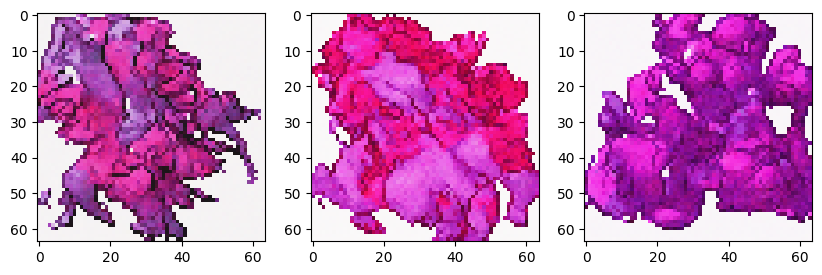

0.02859682:  67%|████████████████████████████████████████████████████████████████████                                 | 100999/150001 [1:28:47<41:13, 19.81it/s]

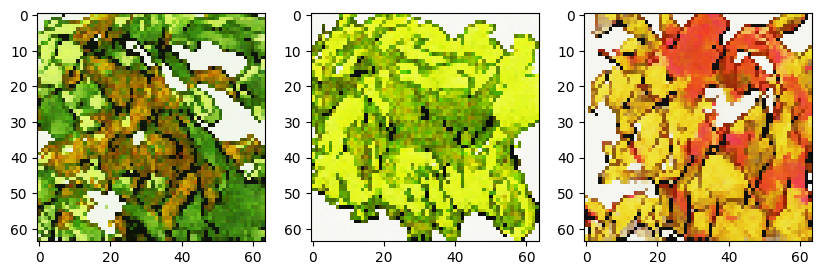

0.04945542:  68%|████████████████████████████████████████████████████████████████████▋                                | 102000/150001 [1:29:40<40:12, 19.90it/s]

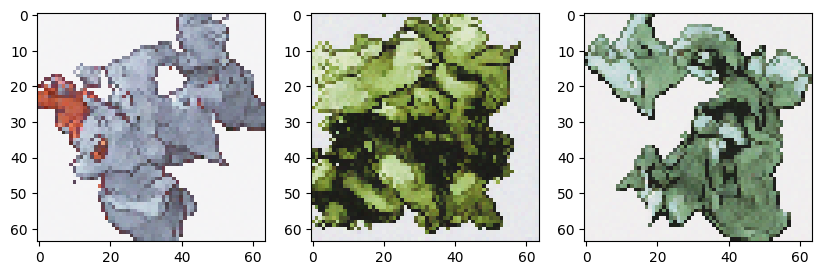

0.02752361:  69%|█████████████████████████████████████████████████████████████████████▎                               | 102999/150001 [1:30:33<39:21, 19.90it/s]

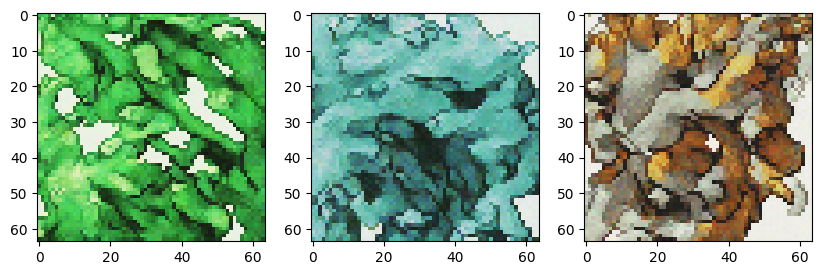

0.03092849:  69%|██████████████████████████████████████████████████████████████████████                               | 103999/150001 [1:31:26<38:28, 19.92it/s]

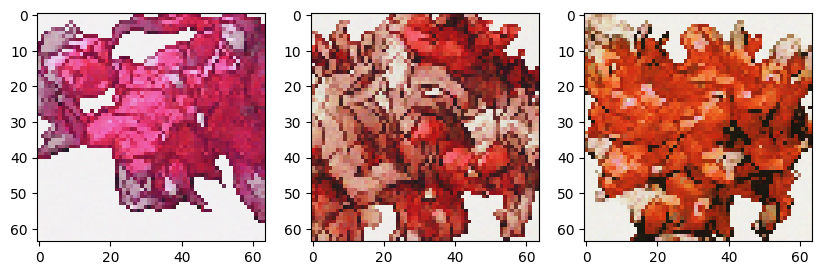

0.02196987:  70%|██████████████████████████████████████████████████████████████████████▋                              | 104999/150001 [1:32:18<37:42, 19.89it/s]

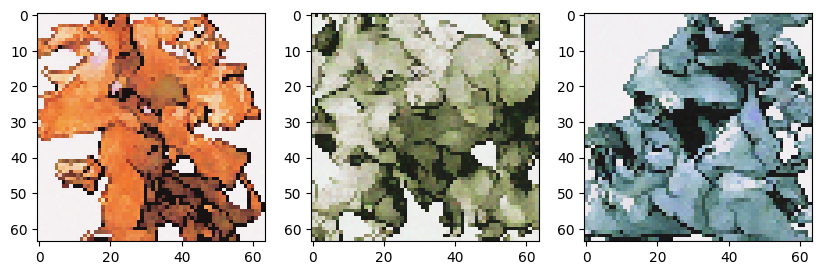

0.01870750:  71%|███████████████████████████████████████████████████████████████████████▎                             | 105999/150001 [1:33:11<37:01, 19.81it/s]

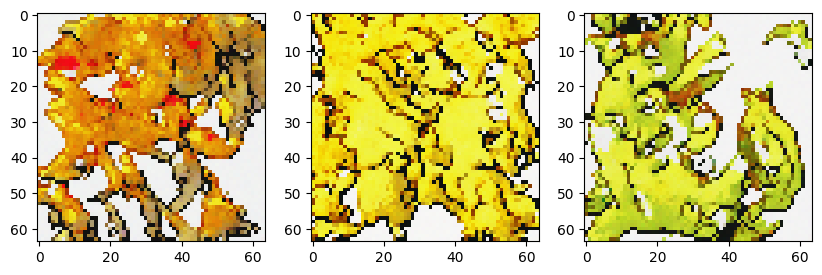

0.01412658:  71%|████████████████████████████████████████████████████████████████████████                             | 106999/150001 [1:34:04<36:08, 19.83it/s]

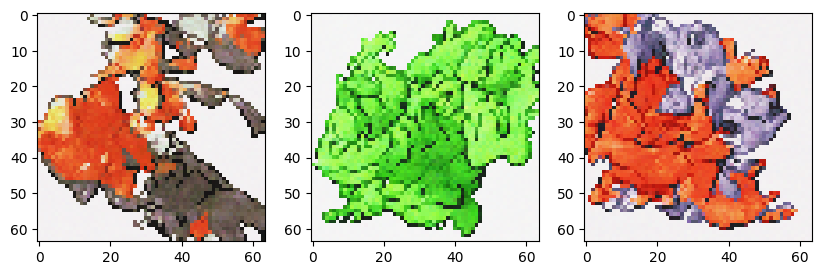

0.01039386:  72%|████████████████████████████████████████████████████████████████████████▋                            | 107999/150001 [1:34:57<35:09, 19.91it/s]

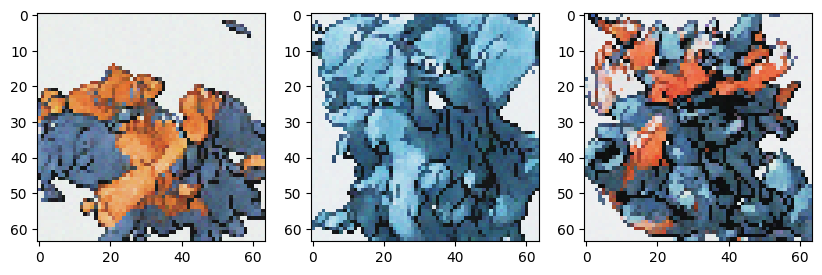

0.01989652:  73%|█████████████████████████████████████████████████████████████████████████▍                           | 108999/150001 [1:35:49<34:28, 19.82it/s]

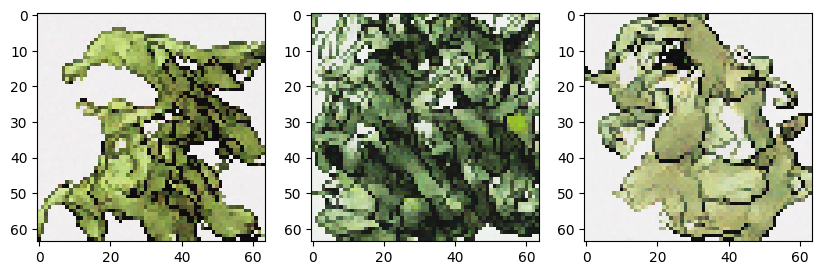

0.01604329:  73%|██████████████████████████████████████████████████████████████████████████                           | 109999/150001 [1:36:42<33:41, 19.79it/s]

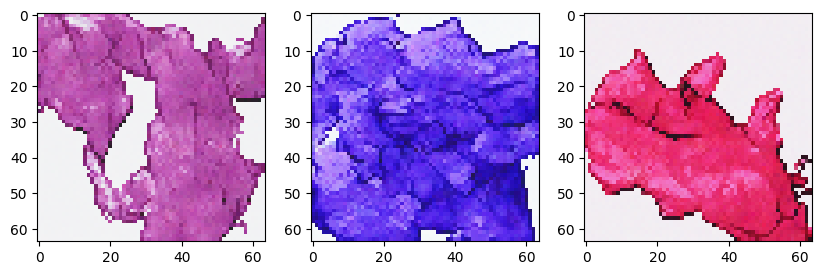

0.01971577:  74%|██████████████████████████████████████████████████████████████████████████▋                          | 110999/150001 [1:37:35<32:48, 19.82it/s]

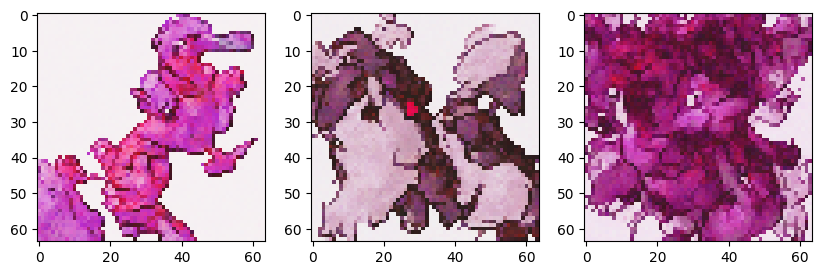

0.02146488:  75%|███████████████████████████████████████████████████████████████████████████▍                         | 111999/150001 [1:38:28<31:52, 19.87it/s]

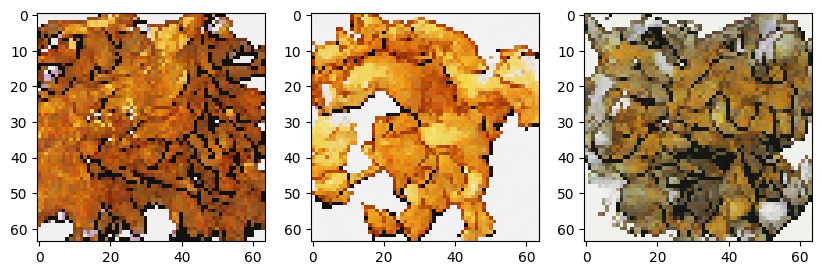

0.02976957:  75%|████████████████████████████████████████████████████████████████████████████                         | 113000/150001 [1:39:21<31:03, 19.86it/s]

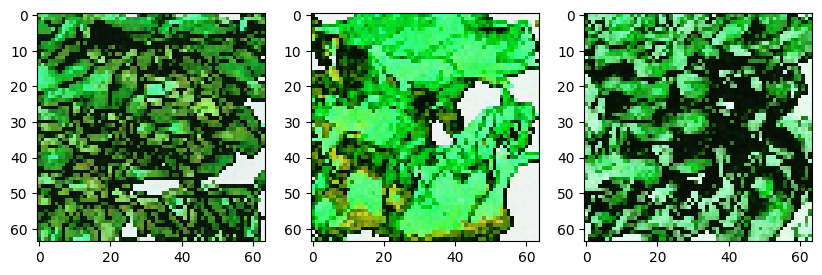

0.03816253:  76%|████████████████████████████████████████████████████████████████████████████▊                        | 113999/150001 [1:40:13<30:07, 19.92it/s]

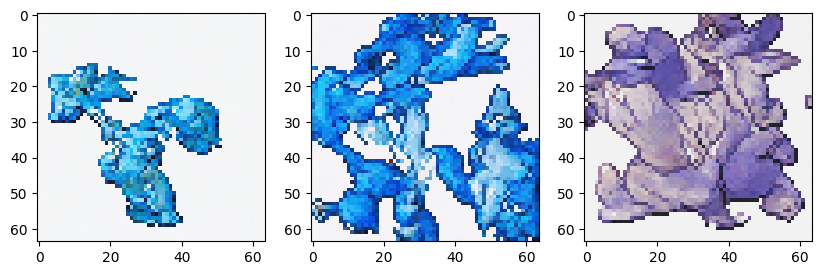

0.03684681:  77%|█████████████████████████████████████████████████████████████████████████████▍                       | 114999/150001 [1:41:06<29:25, 19.83it/s]

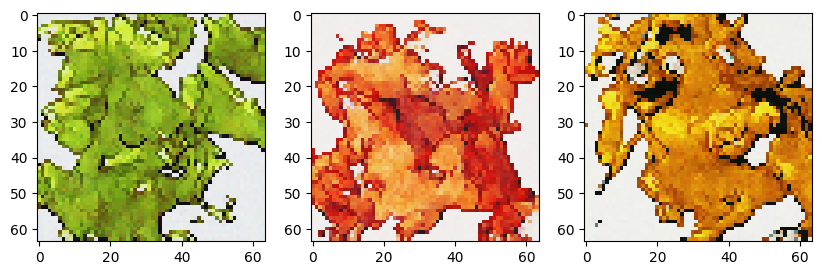

0.04239706:  77%|██████████████████████████████████████████████████████████████████████████████                       | 115999/150001 [1:41:59<28:29, 19.89it/s]

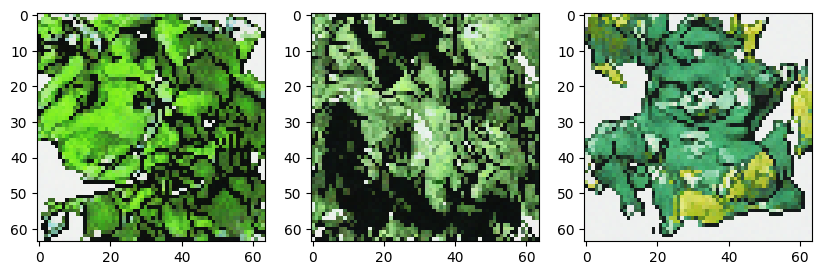

0.02739712:  78%|██████████████████████████████████████████████████████████████████████████████▊                      | 117000/150001 [1:42:52<27:38, 19.89it/s]

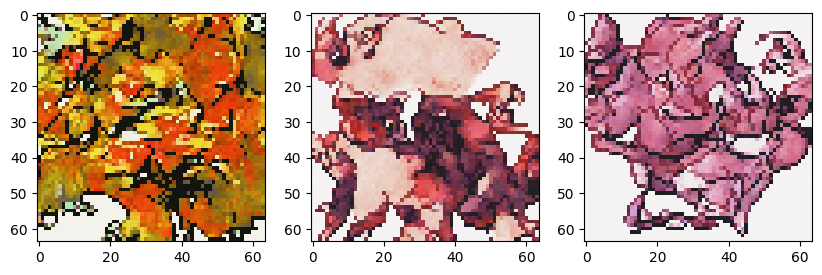

0.01262358:  79%|███████████████████████████████████████████████████████████████████████████████▍                     | 118000/150001 [1:43:44<26:52, 19.85it/s]

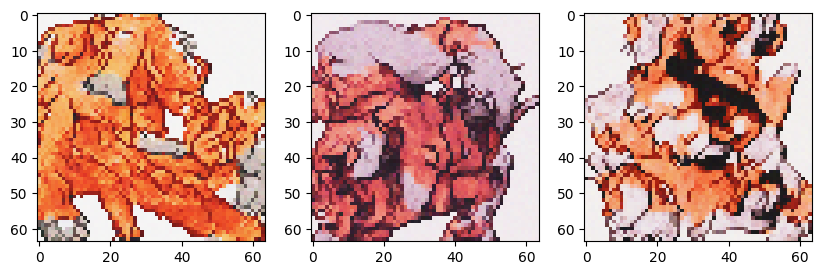

0.02650183:  79%|████████████████████████████████████████████████████████████████████████████████▏                    | 119000/150001 [1:44:37<26:01, 19.85it/s]

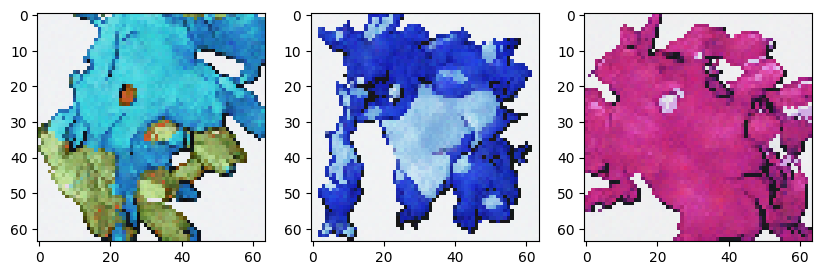

0.02481892:  80%|████████████████████████████████████████████████████████████████████████████████▊                    | 119999/150001 [1:45:30<25:10, 19.87it/s]

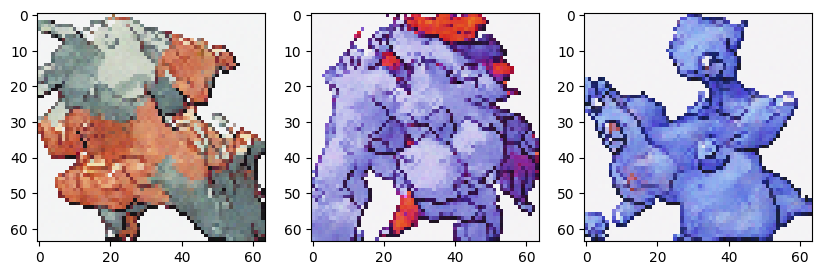

0.03291845:  81%|█████████████████████████████████████████████████████████████████████████████████▍                   | 120999/150001 [1:46:23<24:19, 19.87it/s]

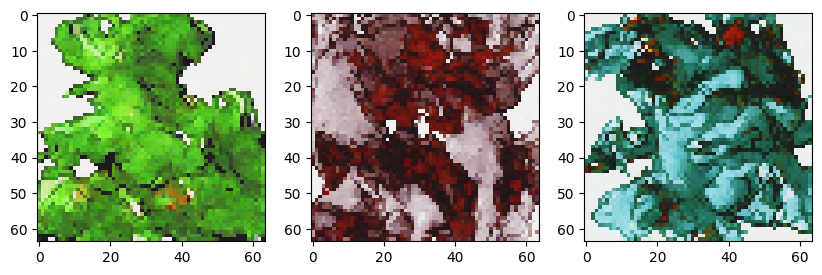

0.03799037:  81%|██████████████████████████████████████████████████████████████████████████████████▏                  | 122000/150001 [1:47:15<23:27, 19.90it/s]

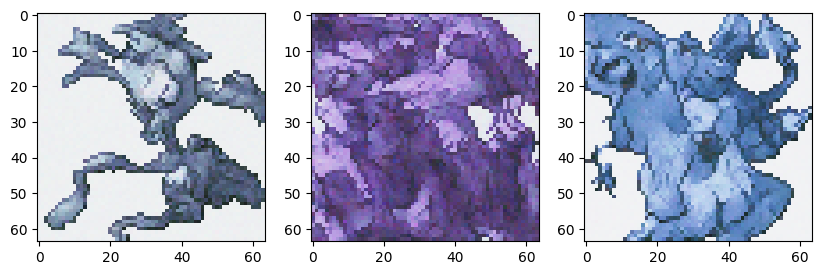

0.02589074:  82%|██████████████████████████████████████████████████████████████████████████████████▊                  | 122999/150001 [1:48:08<22:40, 19.84it/s]

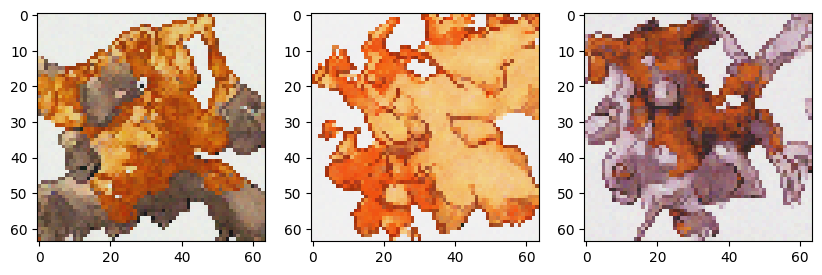

0.02613675:  83%|███████████████████████████████████████████████████████████████████████████████████▍                 | 124000/150001 [1:49:01<21:49, 19.86it/s]

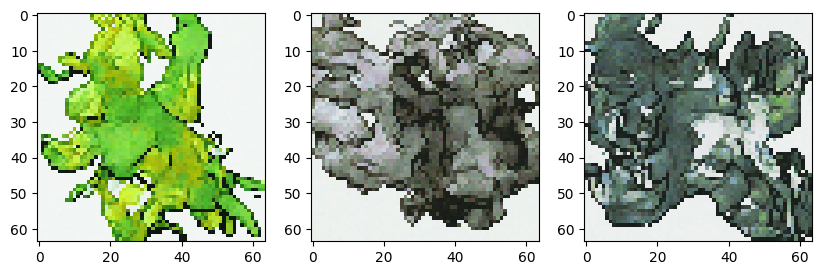

0.01749306:  83%|████████████████████████████████████████████████████████████████████████████████████▏                | 125000/150001 [1:49:54<20:58, 19.87it/s]

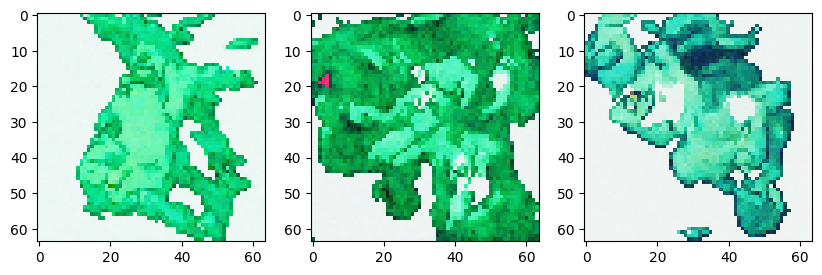

0.02223742:  84%|████████████████████████████████████████████████████████████████████████████████████▊                | 126000/150001 [1:50:46<20:13, 19.78it/s]

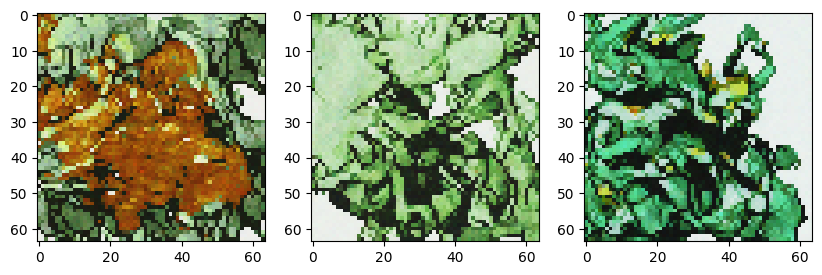

0.01493923:  85%|█████████████████████████████████████████████████████████████████████████████████████▌               | 126999/150001 [1:51:39<19:19, 19.84it/s]

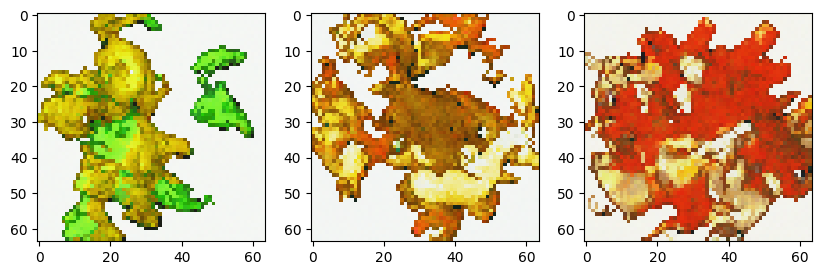

0.02973149:  85%|██████████████████████████████████████████████████████████████████████████████████████▏              | 128000/150001 [1:52:32<18:25, 19.90it/s]

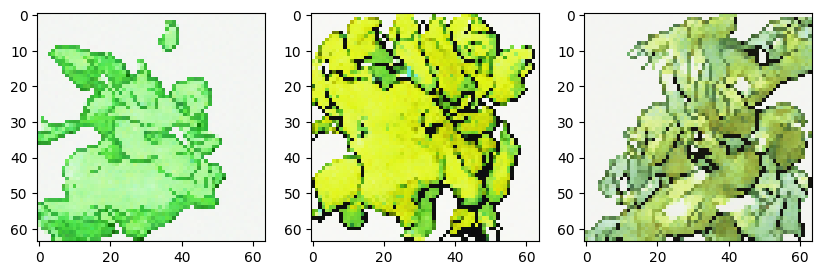

0.00959405:  86%|██████████████████████████████████████████████████████████████████████████████████████▊              | 129000/150001 [1:53:25<17:39, 19.83it/s]

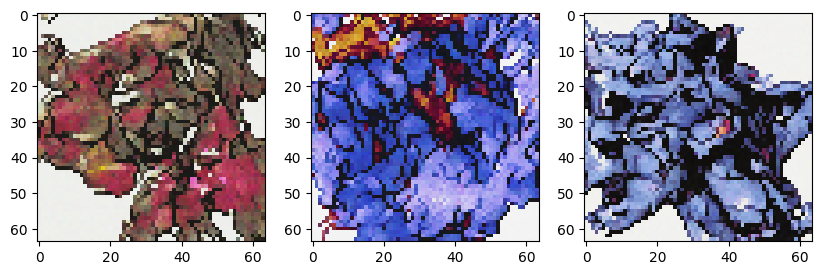

0.03749733:  87%|███████████████████████████████████████████████████████████████████████████████████████▌             | 130000/150001 [1:54:17<16:45, 19.89it/s]

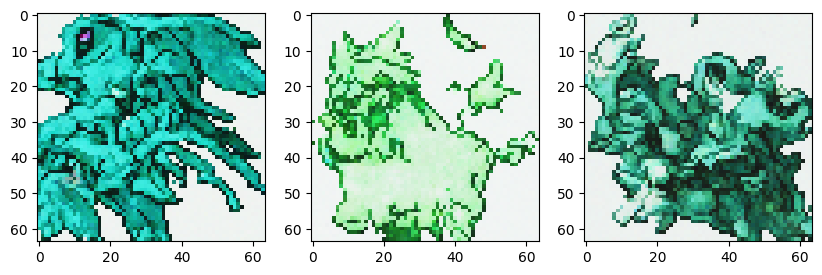

0.02207282:  87%|████████████████████████████████████████████████████████████████████████████████████████▏            | 130999/150001 [1:55:10<15:57, 19.85it/s]

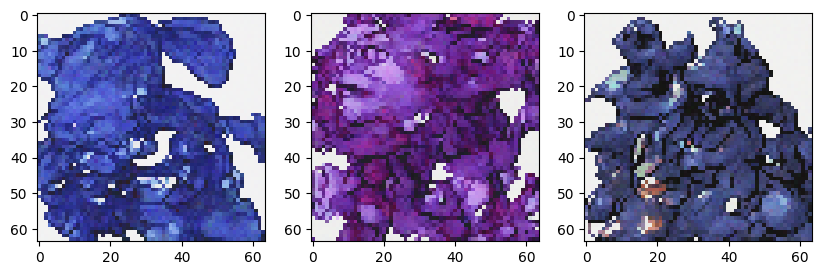

0.03699887:  88%|████████████████████████████████████████████████████████████████████████████████████████▉            | 131999/150001 [1:56:03<15:05, 19.87it/s]

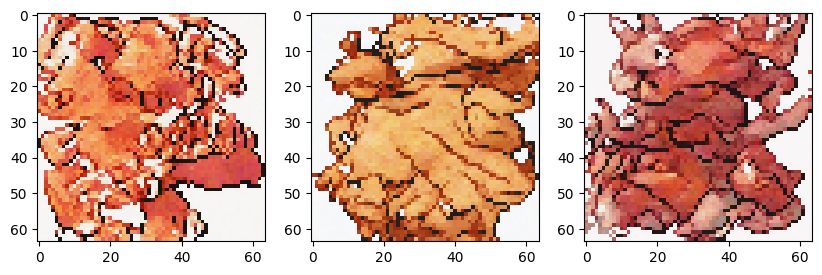

0.03103981:  89%|█████████████████████████████████████████████████████████████████████████████████████████▌           | 133000/150001 [1:56:55<14:13, 19.93it/s]

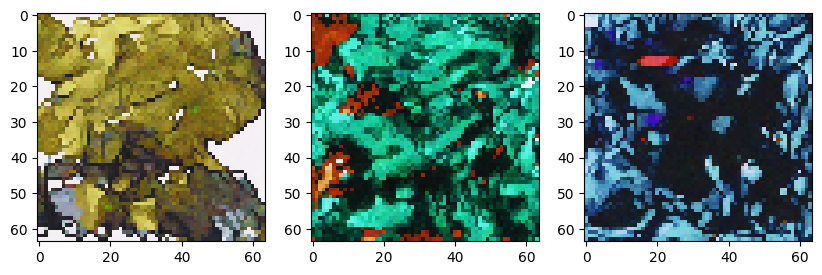

0.01365487:  89%|██████████████████████████████████████████████████████████████████████████████████████████▏          | 133999/150001 [1:57:48<13:24, 19.90it/s]

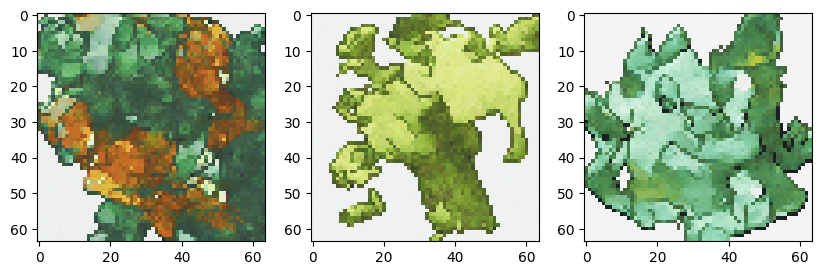

0.03718288:  90%|██████████████████████████████████████████████████████████████████████████████████████████▉          | 134999/150001 [1:58:41<12:34, 19.89it/s]

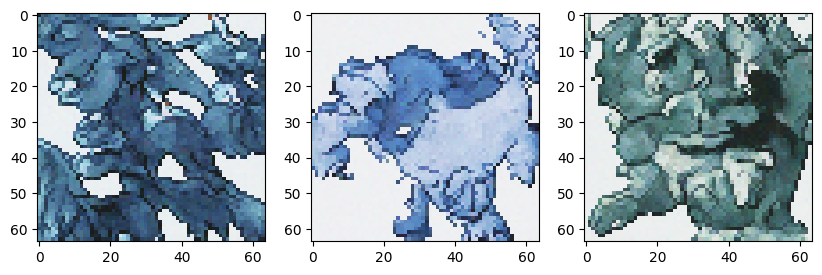

0.01174033:  91%|███████████████████████████████████████████████████████████████████████████████████████████▌         | 136000/150001 [1:59:33<11:44, 19.88it/s]

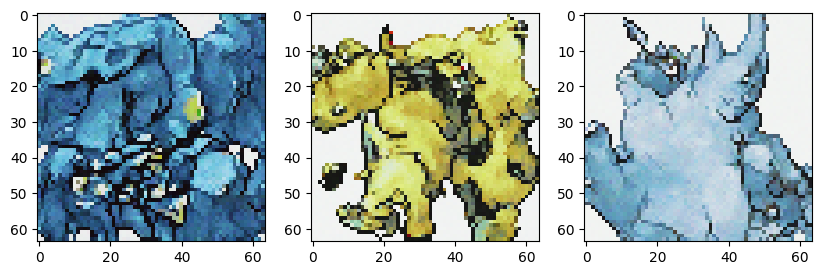

0.03920693:  91%|████████████████████████████████████████████████████████████████████████████████████████████▏        | 136999/150001 [2:00:26<10:55, 19.83it/s]

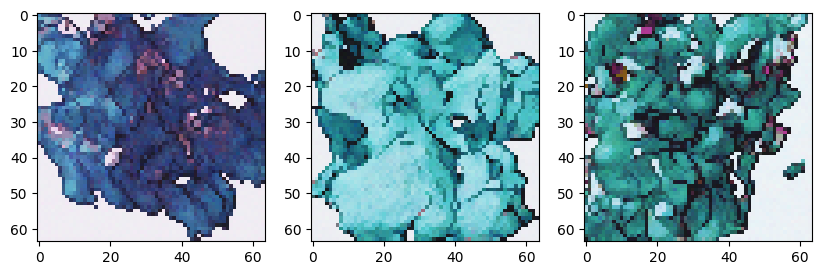

0.02100844:  92%|████████████████████████████████████████████████████████████████████████████████████████████▉        | 137999/150001 [2:01:19<10:05, 19.82it/s]

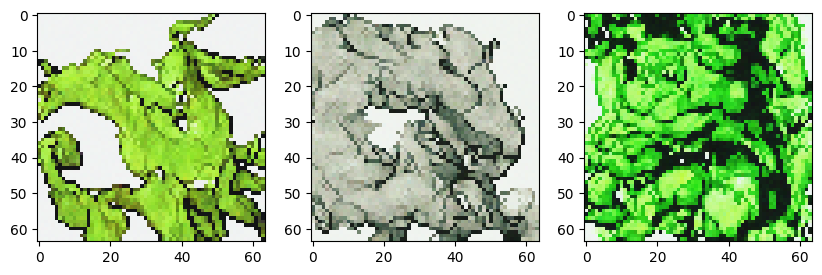

0.01653928:  93%|█████████████████████████████████████████████████████████████████████████████████████████████▌       | 139000/150001 [2:02:12<09:14, 19.84it/s]

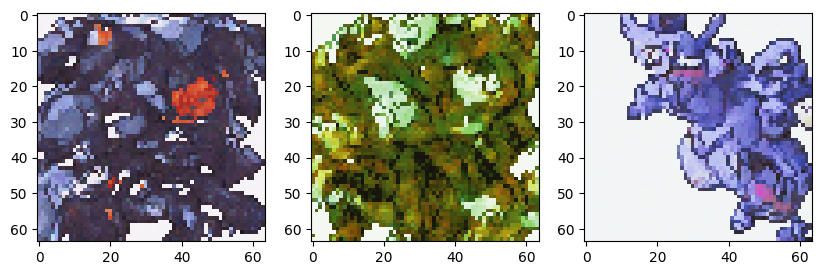

0.03287053:  93%|██████████████████████████████████████████████████████████████████████████████████████████████▎      | 139999/150001 [2:03:05<08:22, 19.92it/s]

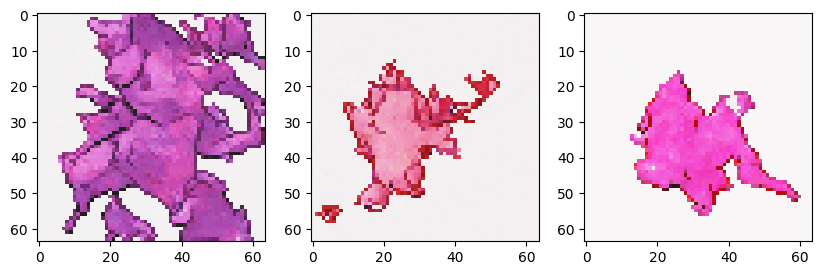

0.02137519:  94%|██████████████████████████████████████████████████████████████████████████████████████████████▉      | 141000/150001 [2:03:57<07:34, 19.82it/s]

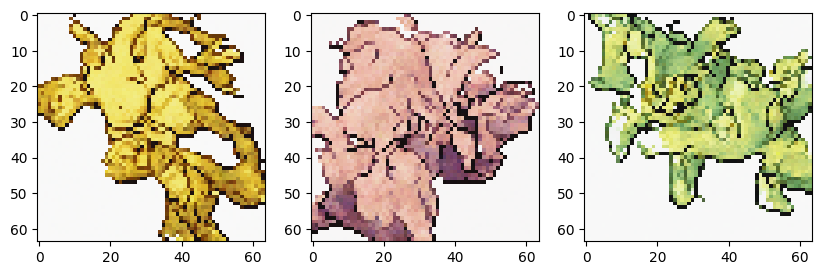

0.04072889:  95%|███████████████████████████████████████████████████████████████████████████████████████████████▌     | 142000/150001 [2:04:50<06:42, 19.86it/s]

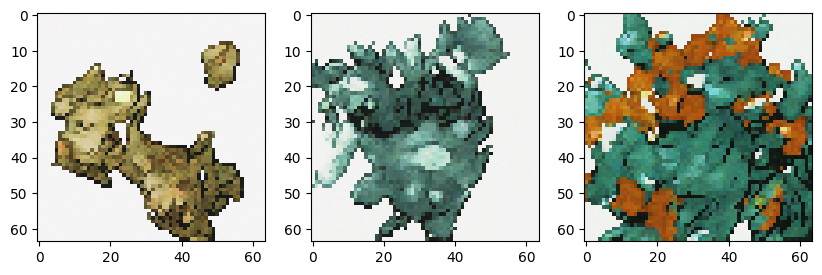

0.02740129:  95%|████████████████████████████████████████████████████████████████████████████████████████████████▎    | 143000/150001 [2:05:43<05:52, 19.85it/s]

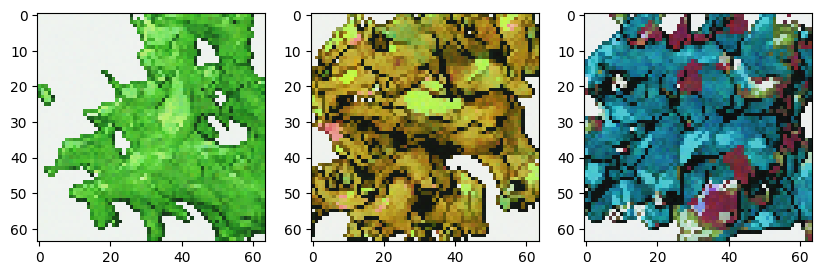

0.03640165:  96%|████████████████████████████████████████████████████████████████████████████████████████████████▉    | 144000/150001 [2:06:36<05:01, 19.88it/s]

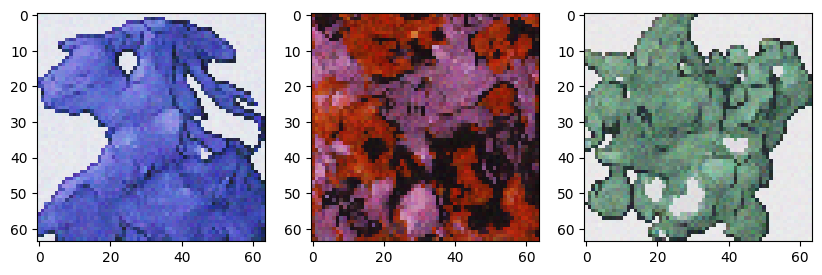

0.01576845:  97%|█████████████████████████████████████████████████████████████████████████████████████████████████▋   | 145000/150001 [2:07:28<04:12, 19.84it/s]

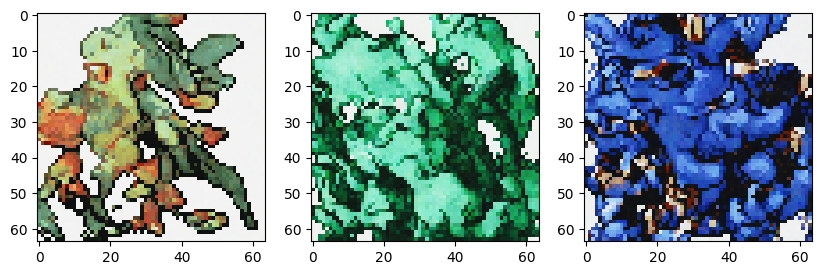

0.02008005:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████▎  | 145999/150001 [2:08:21<03:21, 19.87it/s]

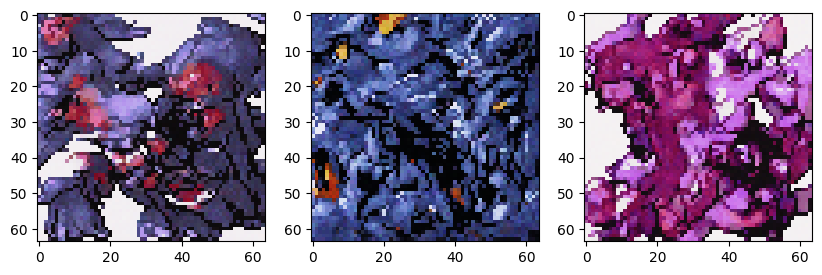

0.03110240:  98%|██████████████████████████████████████████████████████████████████████████████████████████████████▉  | 146999/150001 [2:09:14<02:31, 19.87it/s]

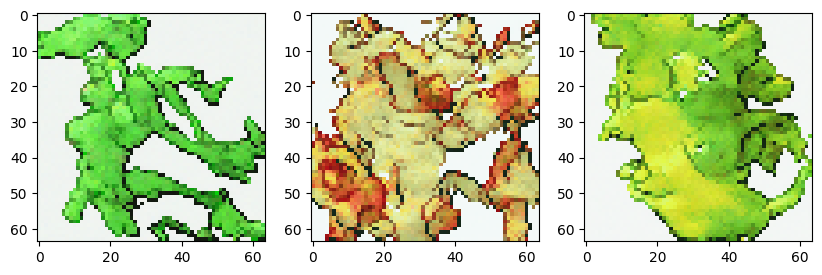

0.02255215:  99%|███████████████████████████████████████████████████████████████████████████████████████████████████▋ | 147999/150001 [2:10:07<01:40, 19.91it/s]

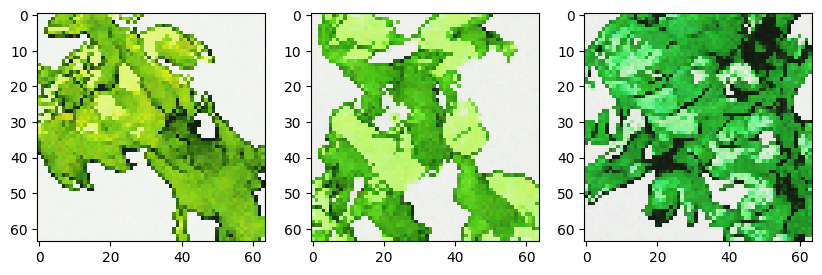

0.01365147:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████▎| 149000/150001 [2:10:59<00:50, 19.88it/s]

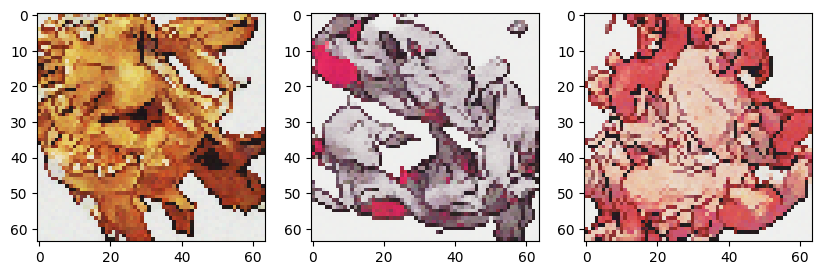

0.04694211: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████▉| 149999/150001 [2:11:52<00:00, 19.89it/s]

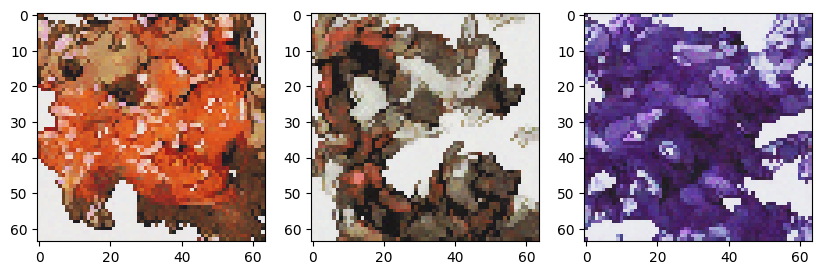

0.02454205: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 150001/150001 [2:11:55<00:00, 18.95it/s]


In [8]:
loss_func = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)
    
pbar = tqdm(range(150001))
def closure():
    optimizer.zero_grad()

    bs = 8

    source = randint(0, 2)
    batch = torch.randperm(385)[:bs]
    x0 = pimages[source, batch]
    x0 = torch.stack([transform(x) for x in x0], dim=0)
    x0 = isigmoid(x0)

    ty = types[batch]
    
    e = torch.randn_like(x0)
    t = torch.randint(0, T - 1, (bs,), device=device)

    xt = torch.sqrt(alpha_[t])[:, None, None, None] * x0 + torch.sqrt(1-alpha_[t])[:, None, None, None] * e
    ep = model(xt, t, ty)

    loss = loss_func(ep, e)
    loss.backward()
    
    pbar.set_description(f"%.8f" % loss, refresh=False)
    
    return loss

model.train()
for j in pbar:
    optimizer.step(closure)

    if j % 1000 == 0:
        generate_image()

torch.save(model.state_dict(), 'model.pt')